Group Members: Hoi Jing Jie(U2020435F), Mah Chi Ming (U2020454L), S DHIPAN(U2020283J)¶

Description:
Breast cancer is the most common cancer amongst women in the world. It accounts for 25% of all cancer cases, and affected over 2.1 Million people in 2015 alone. It starts when cells in the breast begin to grow out of control. These cells usually form tumors that can be seen via X-ray or felt as lumps in the breast area.

Our challenge is to classify and predict the respectivie variables in the dataset into malignant (cancerous) or benign(non cancerous). We will also deploy various ML Algorithms to determine which models is most accurate in this prediction.

In [1]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics

In [2]:
overalldata = pd.read_csv(r'C:\Users\jjont\Downloads\breast-cancer.csv')
#overalldata = pd.read_csv(r'C:\Users\dhipa\OneDrive\Desktop\Mini-Project\breast-cancer.csv')
#overalldata = pd.read_csv(r'C:\NTU\EE0005\Proj\update\breast-cancer.csv')
#overalldata = pd.read_csv(r'C:\Users\chi ming\Desktop\ntu\ee0005 (AI python)\Proj\breast-cancer.csv')
overalldata.head().T

,0,1,2,3,4
id,842302,842517,84300903,84348301,84358402
diagnosis,M,M,M,M,M
radius_mean,17.99,20.57,19.69,11.42,20.29
texture_mean,10.38,17.77,21.25,20.38,14.34
perimeter_mean,122.8,132.9,130.0,77.58,135.1
area_mean,1001.0,1326.0,1203.0,386.1,1297.0
smoothness_mean,0.1184,0.08474,0.1096,0.1425,0.1003
compactness_mean,0.2776,0.07864,0.1599,0.2839,0.1328
concavity_mean,0.3001,0.0869,0.1974,0.2414,0.198
concave points_mean,0.1471,0.07017,0.1279,0.1052,0.1043


In [3]:
means = pd.DataFrame(overalldata.loc[:,"radius_mean":"fractal_dimension_mean"]) #This dataframe only have all the mean data
se = pd.DataFrame(overalldata.loc[:,"radius_se":"fractal_dimension_se"]) #This dataframe only have all the SE data
worst = pd.DataFrame(overalldata.loc[:,"radius_worst":"fractal_dimension_worst"]) #This dataframe only have all the worst data
diagnosisdata = pd.DataFrame(overalldata['diagnosis']) #This dataframe only got diagnosis data
noid= pd.DataFrame(overalldata.loc[:,"diagnosis":"fractal_dimension_worst"]) #This dataframe have all data except ID 
noid_diagnosis = pd.DataFrame(overalldata.loc[:,"radius_mean":"fractal_dimension_worst"]) #This dataframe have all data except ID and diagnosis

Out of 569 data, 357 are Benign and 212 are Malignant.


C:\Users\jjont\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


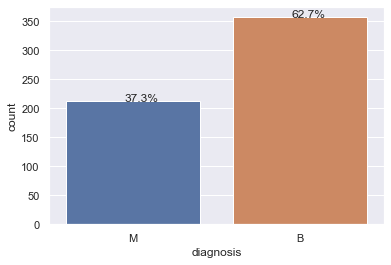

In [4]:
def without_hue(ax, feature):
    total = len(feature)
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size = 12)
        
ax = sb.countplot('diagnosis', data=diagnosisdata)
without_hue(ax, diagnosisdata.diagnosis)
print ("Out of 569 data, 357 are Benign and 212 are Malignant.")

In [5]:
def change(diagnose):
    if diagnose == 'M':
        return 1
    else:
        return 0

noid['diagnosis'] = noid['diagnosis'].apply(change)
noid.head(200)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.16220,0.6656,0.7119,0.26540,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.12380,0.1866,0.2416,0.18600,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.14440,0.4245,0.4504,0.24300,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.20980,0.8663,0.6869,0.25750,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.13740,0.2050,0.4000,0.16250,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,0,12.91,16.33,82.53,516.4,0.07941,0.05366,0.03873,0.02377,0.1829,...,13.88,22.00,90.81,600.6,0.10970,0.1506,0.1764,0.08235,0.3024,0.06949
196,1,13.77,22.29,90.63,588.9,0.12000,0.12670,0.13850,0.06526,0.1834,...,16.39,34.01,111.60,806.9,0.17370,0.3122,0.3809,0.16730,0.3080,0.09333
197,1,18.08,21.84,117.40,1024.0,0.07371,0.08642,0.11030,0.05778,0.1770,...,19.76,24.70,129.10,1228.0,0.08822,0.1963,0.2535,0.09181,0.2369,0.06558
198,1,19.18,22.49,127.50,1148.0,0.08523,0.14280,0.11140,0.06772,0.1767,...,23.36,32.06,166.40,1688.0,0.13220,0.5601,0.3865,0.17080,0.3193,0.09221


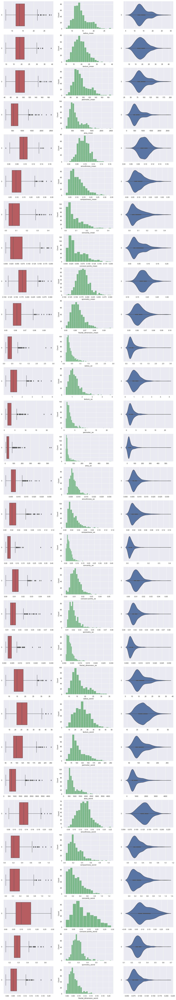

In [6]:
fig, axes = plt.subplots(30,3, figsize = (20,120))

count = 0
for var in noid_diagnosis:
    sb.boxplot(data = noid_diagnosis[var], orient = "h", ax = axes[count,0],color="r")
    sb.histplot(data = noid_diagnosis[var], ax = axes[count,1],color="g")
    sb.violinplot(data = noid_diagnosis[var], orient = "h", ax = axes[count,2])
    
    count += 1

From the boxplot, histoplot and violinplot, we are unable to observe how the respective variables are linked to Benign or Malignant. Hence, this is not a very good tool to do analysis. 

In [7]:
def change(diagnosis):
    if diagnosis == 'M':
        return 'Malignant'
    else:
        return 'Benign'
diagnosisdata['diagnosis'] = diagnosisdata['diagnosis'].apply(change)

Convert the Various M and B into proper Malignant and Benign Terms.

C:\Users\jjont\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 7.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


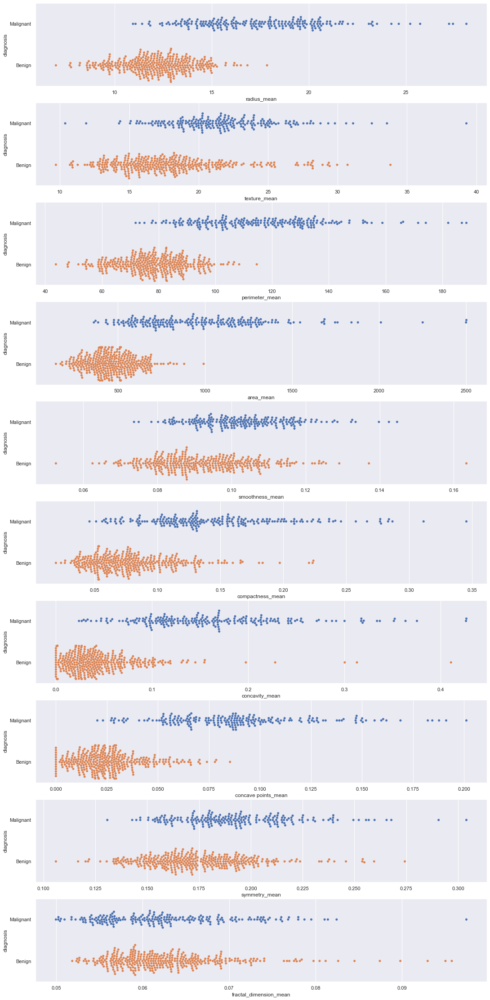

In [8]:
meansDF = pd.concat([diagnosisdata, means], axis =  1) #when u put axis it aligns the diagnosis and mean columns to the respective rows

f, axes = plt.subplots(10, 1, figsize=(18, 40))

count = 0

for var in means: #loop over a pandas dataframe, for each column row by row. (start from radius_mean)
    
    sb.swarmplot(x = var, y = "diagnosis", data = meansDF, orient = "h", ax = axes[count])
    count += 1

From the means data variables, we can observe that the mean values of radius, perimeter, area, compactness, concavity and concave points does have correlation with diagnosis results. The larger values showing a correlation with malignant results. These variables are likely to be correlated to one another.

C:\Users\jjont\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 22.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\jjont\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 28.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\jjont\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 56.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\jjont\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 24.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\jjont\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 13.2% of the points

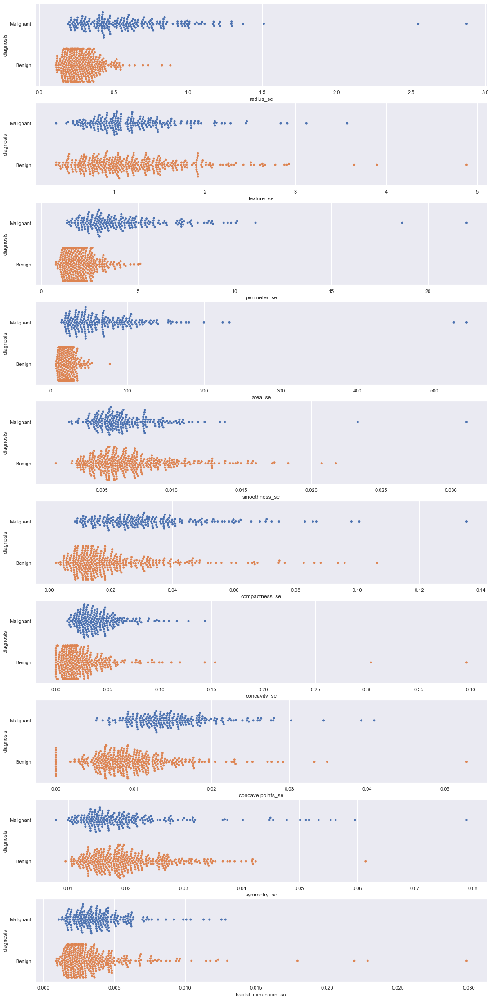

In [9]:
standard_e_DF = pd.concat([diagnosisdata, se], axis =  1) #when u put axis it aligns the diagnosis and mean columns to the respective rows

f, axes = plt.subplots(10, 1, figsize=(18, 40))

count = 0

for var in se: #loop over a pandas dataframe, for each column row by row. (start from radius_mean)
    
    sb.swarmplot(x = var, y = "diagnosis", data = standard_e_DF, orient = "h", ax = axes[count])
    count += 1

In this swarmplot visualization, the standard error of each variables's mean value is used to compare with Malignant results. Only radius_se, perimeter_se and area_se has correlation with Maglinant results.¶

C:\Users\jjont\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 17.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


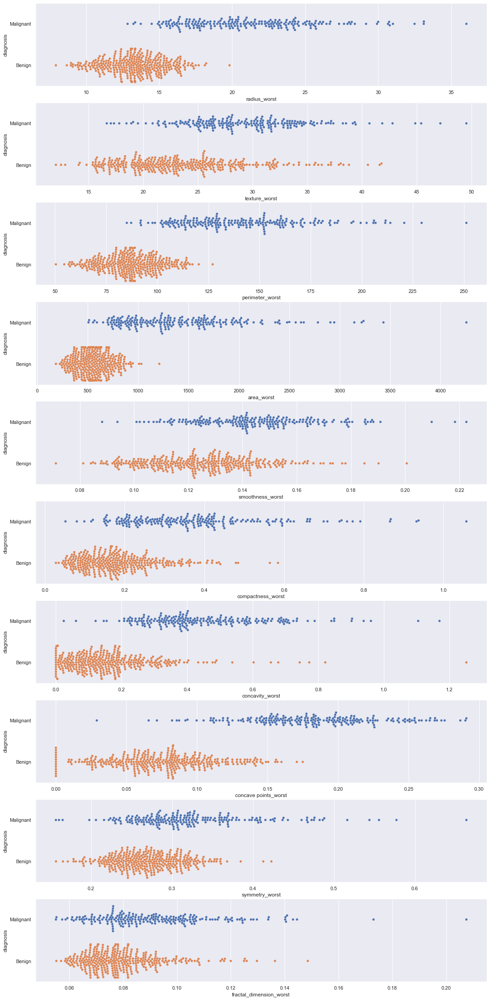

In [10]:
worstDF = pd.concat([diagnosisdata, worst], axis =  1) #when u put axis it aligns the diagnosis and mean columns to the respective rows

f, axes = plt.subplots(10, 1, figsize=(18, 40))

count = 0

for var in worst: #loop over a pandas dataframe, for each column row by row. (start from radius_mean)
    
    sb.swarmplot(x = var, y = "diagnosis", data = worstDF, orient = "h", ax = axes[count])
    count += 1

In this swarm point visualization, the worst, or the largest mean value of the variable is used to visualize the correlation with diagnosis result.

The mean, standard error and largest mean value of variables radius, perimeter and area have a strong correlation with diagnosis, with larger parameters showing a stronger correlation with Malignant results. With the same behaviour, they are likely to be correlated with one another too.

The variables of compactness, concavity and concave points might have a correlation with Maglinant results. The mean values of both variables show larger parameters have a correlation with Maglinant results, standard error of both variables show no correlation with Maglinant results and the largest mean value with larger parameters shows a correlation with Malignant results with the exception of outliers.

Texture, Smoothness, Symmetery and fractal dimension does not have any correlation with Malignant results.

[Text(0.5, 0, 'radius_mean'),
 Text(1.5, 0, 'texture_mean'),
 Text(2.5, 0, 'perimeter_mean'),
 Text(3.5, 0, 'area_mean'),
 Text(4.5, 0, 'smoothness_mean'),
 Text(5.5, 0, 'compactness_mean'),
 Text(6.5, 0, 'concavity_mean'),
 Text(7.5, 0, 'concave points_mean'),
 Text(8.5, 0, 'symmetry_mean'),
 Text(9.5, 0, 'fractal_dimension_mean'),
 Text(10.5, 0, 'radius_se'),
 Text(11.5, 0, 'texture_se'),
 Text(12.5, 0, 'perimeter_se'),
 Text(13.5, 0, 'area_se'),
 Text(14.5, 0, 'smoothness_se'),
 Text(15.5, 0, 'compactness_se'),
 Text(16.5, 0, 'concavity_se'),
 Text(17.5, 0, 'concave points_se'),
 Text(18.5, 0, 'symmetry_se'),
 Text(19.5, 0, 'fractal_dimension_se'),
 Text(20.5, 0, 'radius_worst'),
 Text(21.5, 0, 'texture_worst'),
 Text(22.5, 0, 'perimeter_worst'),
 Text(23.5, 0, 'area_worst'),
 Text(24.5, 0, 'smoothness_worst'),
 Text(25.5, 0, 'compactness_worst'),
 Text(26.5, 0, 'concavity_worst'),
 Text(27.5, 0, 'concave points_worst'),
 Text(28.5, 0, 'symmetry_worst'),
 Text(29.5, 0, 'fractal_dime

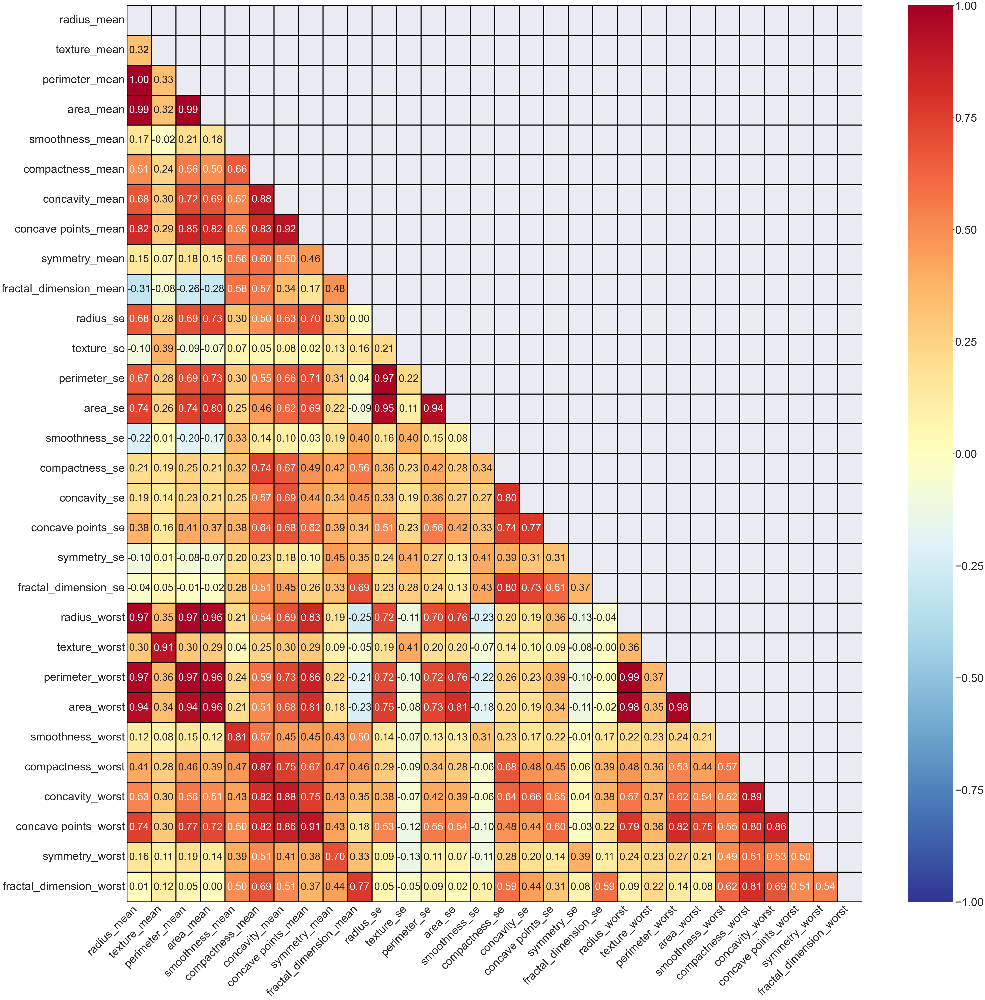

In [11]:
# Heatmap of the Correlation Matrix
sb.set(font_scale=5)  #font size of coloumns and rows
mask = np.triu(np.ones_like(noid_diagnosis.corr()))

f, axes = plt.subplots(1, 1, figsize=(80, 80))

all_heatmap = sb.heatmap(noid_diagnosis.corr(), mask=mask, vmin = -1, vmax = 1, linewidths = 5, linecolor = 'black',
           annot = True, fmt = ".2f", annot_kws = {"size": 50}, cmap = "RdYlBu_r")
all_heatmap.set_xticklabels(all_heatmap.get_xticklabels(),rotation=45, horizontalalignment='right')

The correlation matrix is too messy for interpretations. Lets try to use masking and set the following.
1) Positive Correlation 
2) Negative Correalation
3) No Correlation

[Text(0.5, 0, 'radius_mean'),
 Text(1.5, 0, 'texture_mean'),
 Text(2.5, 0, 'perimeter_mean'),
 Text(3.5, 0, 'area_mean'),
 Text(4.5, 0, 'smoothness_mean'),
 Text(5.5, 0, 'compactness_mean'),
 Text(6.5, 0, 'concavity_mean'),
 Text(7.5, 0, 'concave points_mean'),
 Text(8.5, 0, 'symmetry_mean'),
 Text(9.5, 0, 'fractal_dimension_mean'),
 Text(10.5, 0, 'radius_se'),
 Text(11.5, 0, 'texture_se'),
 Text(12.5, 0, 'perimeter_se'),
 Text(13.5, 0, 'area_se'),
 Text(14.5, 0, 'smoothness_se'),
 Text(15.5, 0, 'compactness_se'),
 Text(16.5, 0, 'concavity_se'),
 Text(17.5, 0, 'concave points_se'),
 Text(18.5, 0, 'symmetry_se'),
 Text(19.5, 0, 'fractal_dimension_se'),
 Text(20.5, 0, 'radius_worst'),
 Text(21.5, 0, 'texture_worst'),
 Text(22.5, 0, 'perimeter_worst'),
 Text(23.5, 0, 'area_worst'),
 Text(24.5, 0, 'smoothness_worst'),
 Text(25.5, 0, 'compactness_worst'),
 Text(26.5, 0, 'concavity_worst'),
 Text(27.5, 0, 'concave points_worst'),
 Text(28.5, 0, 'symmetry_worst'),
 Text(29.5, 0, 'fractal_dime

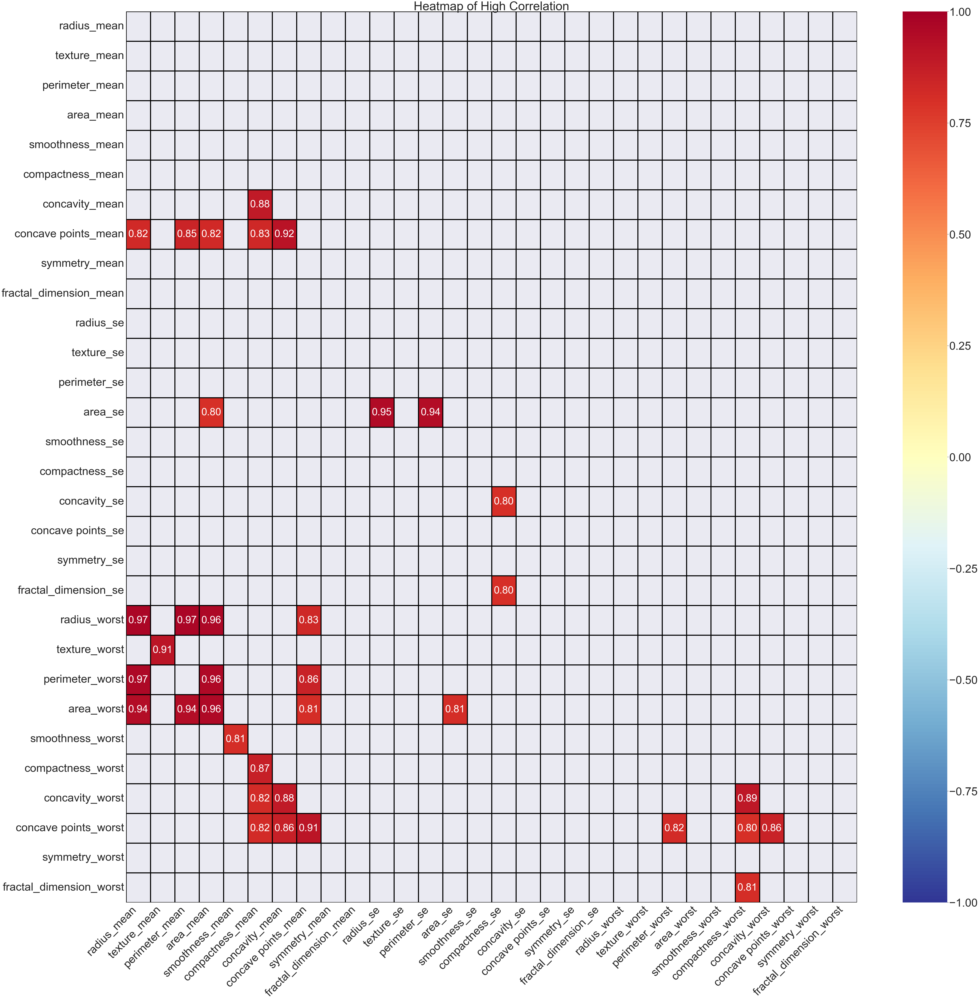

In [12]:
# Heatmap of the Correlation Matrix
sb.set(font_scale=5)  #font size of coloumns and rows

f, axes = plt.subplots(1, 1, figsize=(80, 80))
mask = np.triu(np.ones_like(noid_diagnosis.corr()))

noid_corr = noid_diagnosis.corr() #noid_corr contains all the corr data of noid_diagnosis.corr()
mask_noid_corr = noid_corr [(noid_corr >= 0.80) & (noid_corr < 0.97)] #perform masking of noid_corr based on perimeter



all_heatmap = sb.heatmap(mask_noid_corr, mask= mask, vmin = -1, vmax = 1, linewidths = 5, linecolor = 'black',
           annot = True, fmt = ".2f", annot_kws = {"size": 50}, cmap = "RdYlBu_r")
all_heatmap.set_title("Heatmap of High Correlation")
all_heatmap.set_xticklabels(all_heatmap.get_xticklabels(),rotation=45, horizontalalignment='right')


[Text(0.5, 0, 'radius_mean'),
 Text(1.5, 0, 'texture_mean'),
 Text(2.5, 0, 'perimeter_mean'),
 Text(3.5, 0, 'area_mean'),
 Text(4.5, 0, 'smoothness_mean'),
 Text(5.5, 0, 'compactness_mean'),
 Text(6.5, 0, 'concavity_mean'),
 Text(7.5, 0, 'concave points_mean'),
 Text(8.5, 0, 'symmetry_mean'),
 Text(9.5, 0, 'fractal_dimension_mean'),
 Text(10.5, 0, 'radius_se'),
 Text(11.5, 0, 'texture_se'),
 Text(12.5, 0, 'perimeter_se'),
 Text(13.5, 0, 'area_se'),
 Text(14.5, 0, 'smoothness_se'),
 Text(15.5, 0, 'compactness_se'),
 Text(16.5, 0, 'concavity_se'),
 Text(17.5, 0, 'concave points_se'),
 Text(18.5, 0, 'symmetry_se'),
 Text(19.5, 0, 'fractal_dimension_se'),
 Text(20.5, 0, 'radius_worst'),
 Text(21.5, 0, 'texture_worst'),
 Text(22.5, 0, 'perimeter_worst'),
 Text(23.5, 0, 'area_worst'),
 Text(24.5, 0, 'smoothness_worst'),
 Text(25.5, 0, 'compactness_worst'),
 Text(26.5, 0, 'concavity_worst'),
 Text(27.5, 0, 'concave points_worst'),
 Text(28.5, 0, 'symmetry_worst'),
 Text(29.5, 0, 'fractal_dime

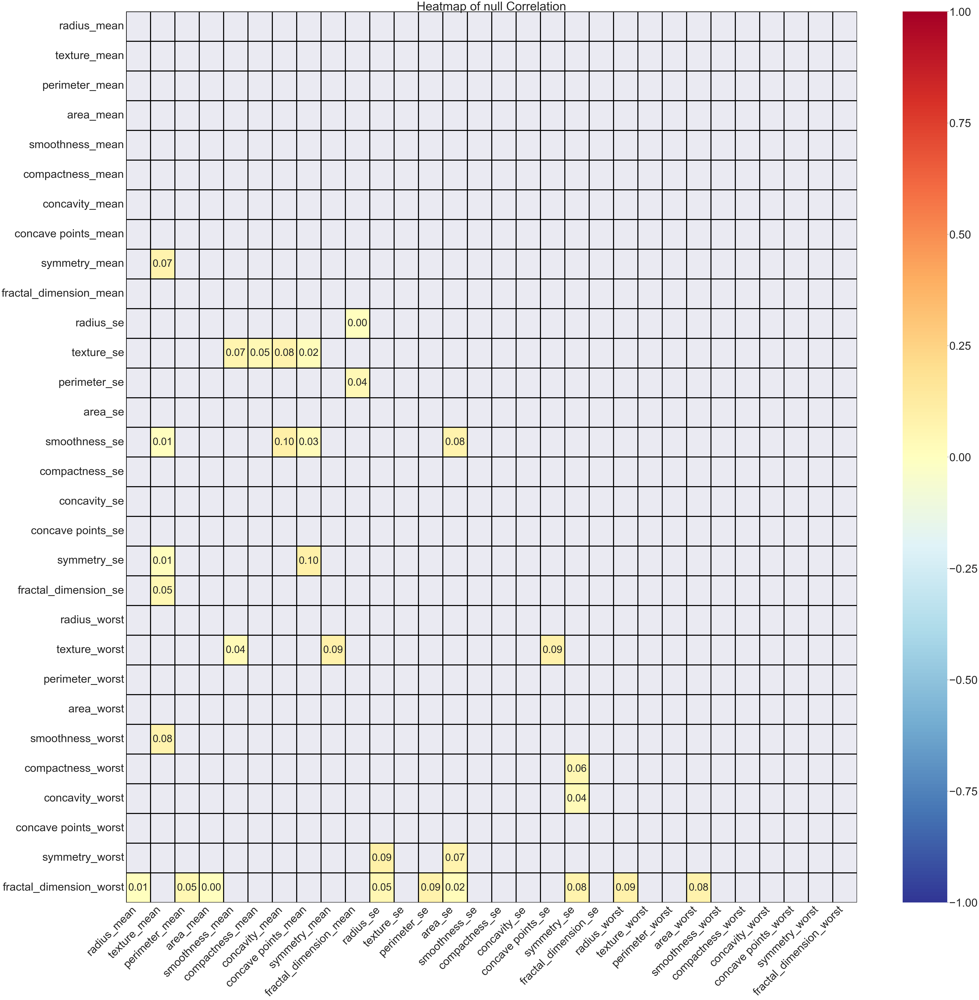

In [13]:
# Heatmap of the Correlation Matrix
sb.set(font_scale=5)  #font size of coloumns and rows

f, axes = plt.subplots(1, 1, figsize=(80, 80))
mask = np.triu(np.ones_like(noid_diagnosis.corr()))

noid_corr = noid_diagnosis.corr()
mask_noid_corr = noid_corr [(noid_corr > 0.0) & (noid_corr <= 0.10)]


all_heatmap = sb.heatmap(mask_noid_corr, mask= mask, vmin = -1, vmax = 1, linewidths = 5, linecolor = 'black',
           annot = True, fmt = ".2f", annot_kws = {"size": 50}, cmap = "RdYlBu_r")
all_heatmap.set_title("Heatmap of null Correlation")
all_heatmap.set_xticklabels(all_heatmap.get_xticklabels(),rotation=45, horizontalalignment='right')


[Text(0.5, 0, 'radius_mean'),
 Text(1.5, 0, 'texture_mean'),
 Text(2.5, 0, 'perimeter_mean'),
 Text(3.5, 0, 'area_mean'),
 Text(4.5, 0, 'smoothness_mean'),
 Text(5.5, 0, 'compactness_mean'),
 Text(6.5, 0, 'concavity_mean'),
 Text(7.5, 0, 'concave points_mean'),
 Text(8.5, 0, 'symmetry_mean'),
 Text(9.5, 0, 'fractal_dimension_mean'),
 Text(10.5, 0, 'radius_se'),
 Text(11.5, 0, 'texture_se'),
 Text(12.5, 0, 'perimeter_se'),
 Text(13.5, 0, 'area_se'),
 Text(14.5, 0, 'smoothness_se'),
 Text(15.5, 0, 'compactness_se'),
 Text(16.5, 0, 'concavity_se'),
 Text(17.5, 0, 'concave points_se'),
 Text(18.5, 0, 'symmetry_se'),
 Text(19.5, 0, 'fractal_dimension_se'),
 Text(20.5, 0, 'radius_worst'),
 Text(21.5, 0, 'texture_worst'),
 Text(22.5, 0, 'perimeter_worst'),
 Text(23.5, 0, 'area_worst'),
 Text(24.5, 0, 'smoothness_worst'),
 Text(25.5, 0, 'compactness_worst'),
 Text(26.5, 0, 'concavity_worst'),
 Text(27.5, 0, 'concave points_worst'),
 Text(28.5, 0, 'symmetry_worst'),
 Text(29.5, 0, 'fractal_dime

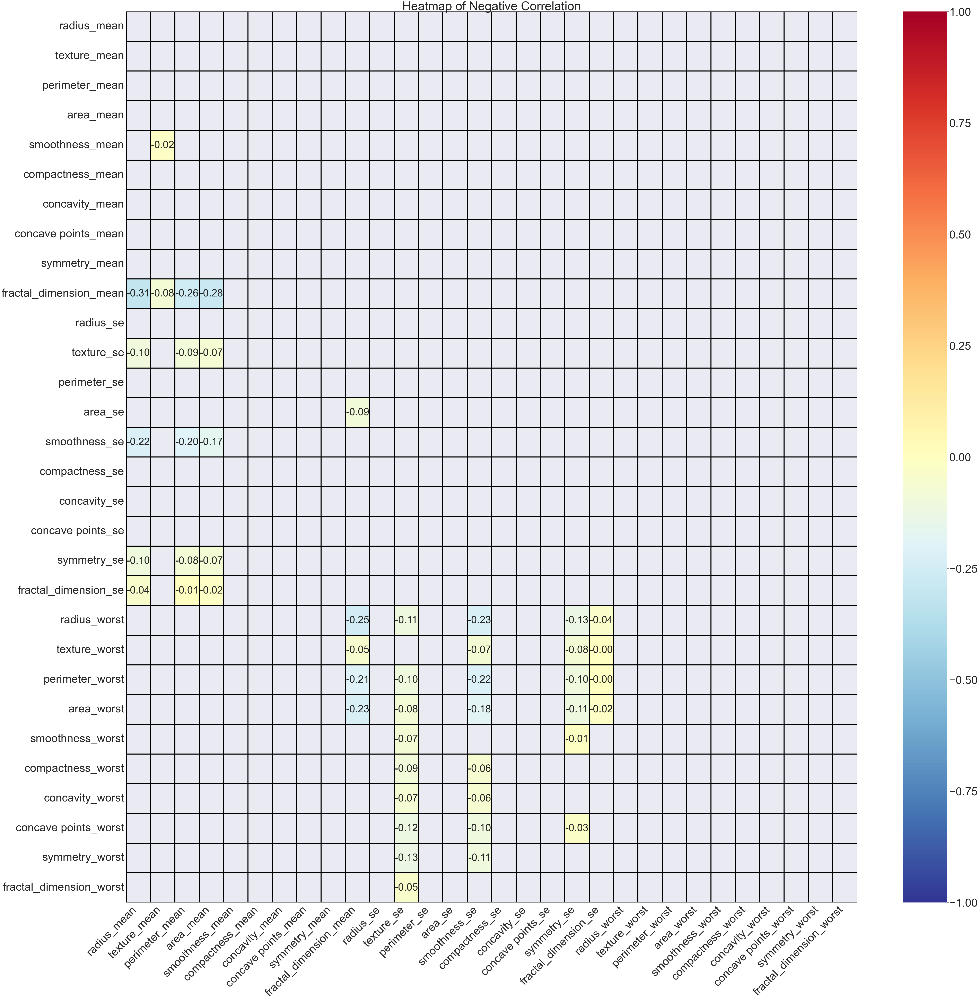

In [14]:
# Heatmap of the Correlation Matrix
sb.set(font_scale=5)  #font size of coloumns and rows

f, axes = plt.subplots(1, 1, figsize=(80, 80))
mask = np.triu(np.ones_like(noid_diagnosis.corr()))

noid_corr = noid_diagnosis.corr()
mask_noid_corr = noid_corr [(noid_corr <= 0.0)]


all_heatmap = sb.heatmap(mask_noid_corr,mask= mask, vmin = -1, vmax = 1, linewidths = 5, linecolor = 'black',
           annot = True, fmt = ".2f", annot_kws = {"size": 50}, cmap = "RdYlBu_r")
all_heatmap.set_title("Heatmap of Negative Correlation")
all_heatmap.set_xticklabels(all_heatmap.get_xticklabels(),rotation=45, horizontalalignment='right')

As expected, the variables that correlated with malignant are also correlated with one another. We will justify our observation below.

In [15]:
import matplotlib.patches as mpatches

#Set legend discription
benign=mpatches.Patch(color='blue',label='Benign')
malignant=mpatches.Patch(color='red',label='Malignant')

#pcorrelation means positive correlation '+'
#necorrelation means negative correlation '-'
#nulllcorrelation means no correplation = 0

pcorrelation_1 = pd.DataFrame(noid[["diagnosis", "radius_mean", "perimeter_worst"]])
pcorrelation_2 = pd.DataFrame(noid[["diagnosis", "area_mean", "perimeter_worst"]])
pcorrelation_3 = pd.DataFrame(noid[["diagnosis", "concave points_mean", "perimeter_worst"]])
pcorrelation_4 = pd.DataFrame(noid[["diagnosis", "concave points_worst", "perimeter_worst"]])

pcorrelation_5 = pd.DataFrame(noid[["diagnosis", "compactness_mean", "concave points_worst"]])
pcorrelation_6 = pd.DataFrame(noid[["diagnosis", "compactness_mean", "concavity_worst"]])
pcorrelation_7 = pd.DataFrame(noid[["diagnosis", "compactness_mean", "perimeter_worst"]])
pcorrelation_8 = pd.DataFrame(noid[["diagnosis", "compactness_mean", "concave points_worst"]])

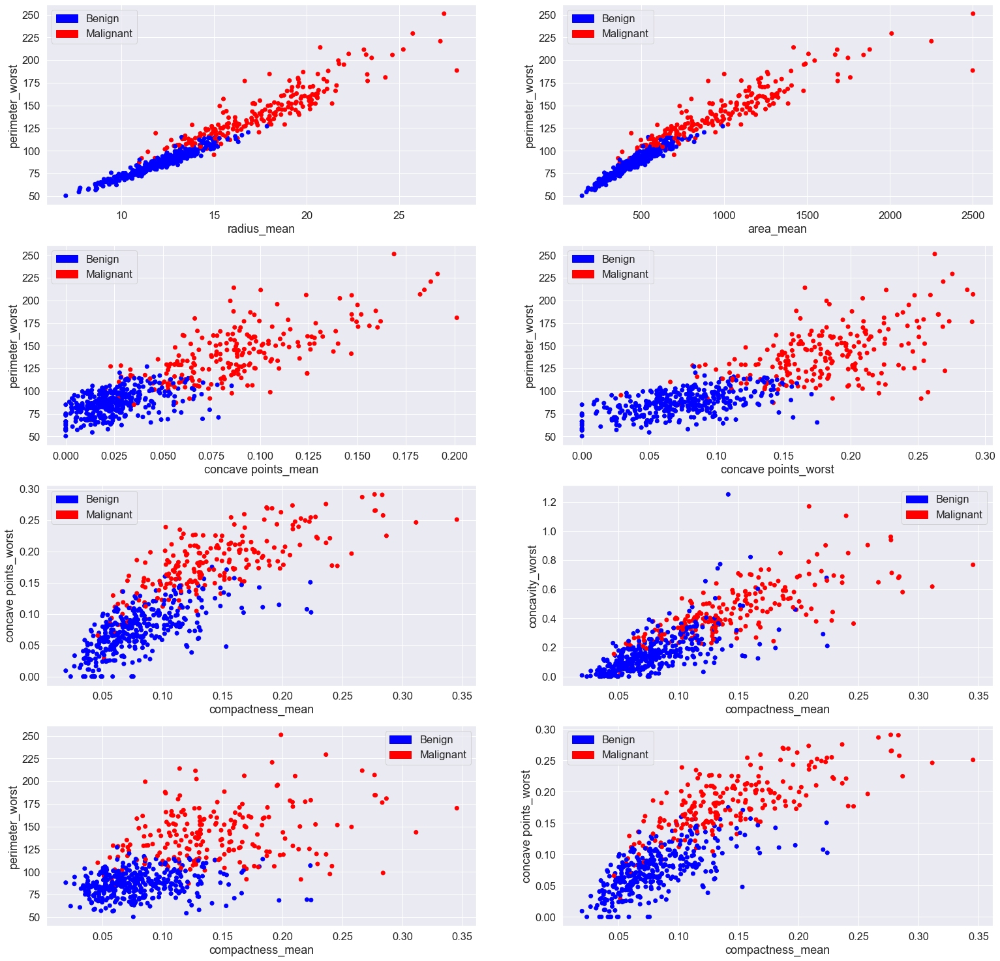

In [16]:
sb.set(font_scale=1.5)  #font size of coloumns and rows
f, axes = plt.subplots(4, 2, figsize=(26 ,26))

#This 4 groups with correlation of 0.9 above

axes[0, 0].scatter(x = "radius_mean", y = "perimeter_worst", cmap = 'bwr', c = 'diagnosis', data = pcorrelation_1)
axes[0, 0].set_xlabel('radius_mean')
axes[0, 0].set_ylabel('perimeter_worst')
axes[0, 0].legend(handles=[benign, malignant])

axes[0, 1].scatter(x = "area_mean", y = "perimeter_worst", cmap = 'bwr', c = 'diagnosis', data = pcorrelation_2)
axes[0, 1].set_xlabel('area_mean')
axes[0, 1].set_ylabel('perimeter_worst')
axes[0, 1].legend(handles=[benign, malignant])


axes[1, 0].scatter(x = "concave points_mean", y = "perimeter_worst", cmap = 'bwr', c = 'diagnosis', data = pcorrelation_3)
axes[1, 0].set_xlabel('concave points_mean')
axes[1, 0].set_ylabel('perimeter_worst')
axes[1, 0].legend(handles=[benign, malignant])


axes[1, 1].scatter(x = "concave points_worst", y = "perimeter_worst", cmap = 'bwr', c = 'diagnosis', data = pcorrelation_4)
axes[1, 1].set_xlabel('concave points_worst')
axes[1, 1].set_ylabel('perimeter_worst')
axes[1, 1].legend(handles=[benign, malignant])


#---------------------------------------------------------------------------------------------------------------------------
#this 4 groups has correlation of 0.8 above 
axes[2, 0].scatter(x = "compactness_mean", y = "concave points_worst", cmap = 'bwr', c = 'diagnosis', data = pcorrelation_5)
axes[2, 0].set_xlabel('compactness_mean')
axes[2, 0].set_ylabel('concave points_worst')
axes[2, 0].legend(handles=[benign, malignant])


axes[2, 1].scatter(x = "compactness_mean", y = "concavity_worst", cmap = 'bwr', c = 'diagnosis', data = pcorrelation_6)
axes[2, 1].set_xlabel('compactness_mean')
axes[2, 1].set_ylabel('concavity_worst')
axes[2, 1].legend(handles=[benign, malignant])


axes[3, 0].scatter(x = "compactness_mean", y = "perimeter_worst", cmap = 'bwr', c = 'diagnosis', data = pcorrelation_7)
axes[3, 0].set_xlabel('compactness_mean')
axes[3, 0].set_ylabel('perimeter_worst')
axes[3, 0].legend(handles=[benign, malignant])


axes[3, 1].scatter(x = "compactness_mean", y = "concave points_worst", cmap = 'bwr', c = 'diagnosis', data = pcorrelation_8)
axes[3, 1].set_xlabel('compactness_mean')
axes[3, 1].set_ylabel('concave points_worst')
axes[3, 1].legend(handles=[benign, malignant])

In [17]:
necorrelation_1 = pd.DataFrame(noid[["diagnosis", "fractal_dimension_mean", "perimeter_worst"]])
necorrelation_2 = pd.DataFrame(noid[["diagnosis", "radius_worst", "smoothness_se"]])
necorrelation_3 = pd.DataFrame(noid[["diagnosis", "fractal_dimension_mean", "radius_mean"]])
necorrelation_4 = pd.DataFrame(noid[["diagnosis", "fractal_dimension_mean", "area_worst"]])

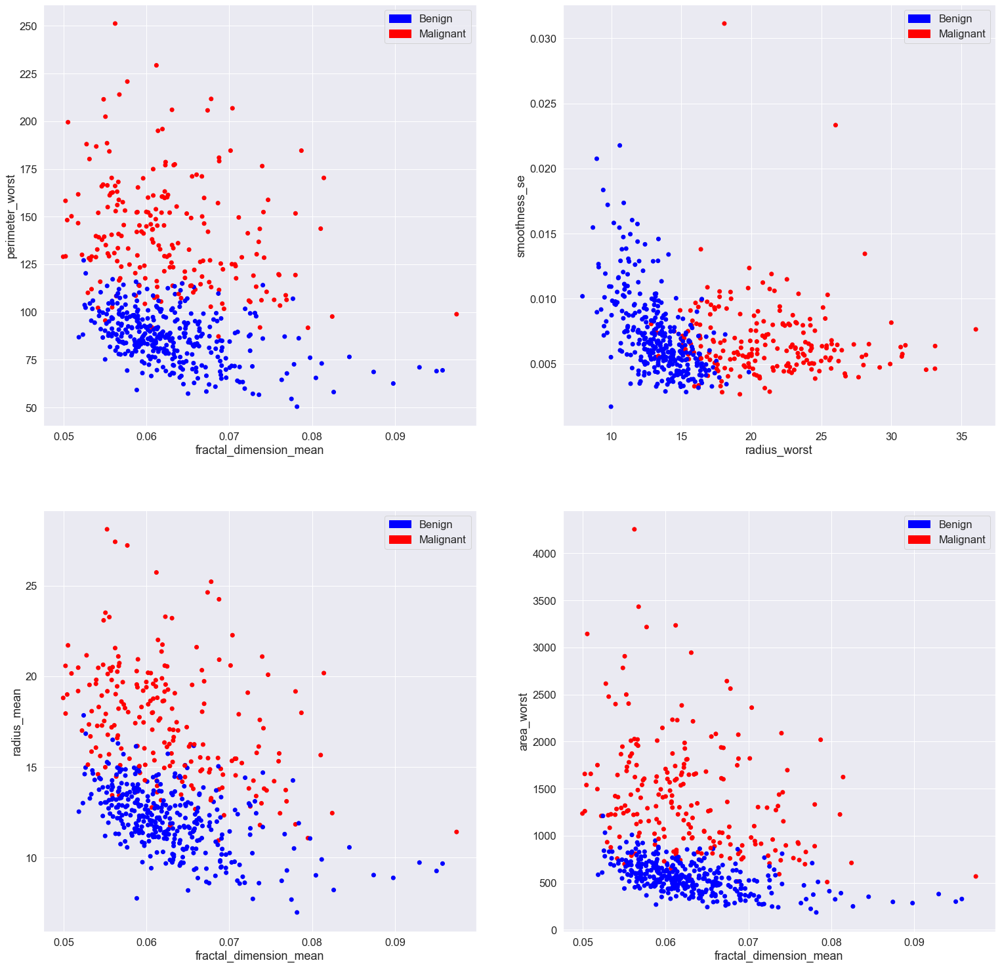

In [18]:
sb.set(font_scale=1.5)  #font size of coloumns and rows
f, axes = plt.subplots(2, 2, figsize=(26 ,26))

axes[0, 0].scatter(x = "fractal_dimension_mean", y = "perimeter_worst", cmap = 'bwr', c = 'diagnosis', data = necorrelation_1)
axes[0, 0].set_xlabel('fractal_dimension_mean')
axes[0, 0].set_ylabel('perimeter_worst')
axes[0, 0].legend(handles=[benign, malignant])


axes[0, 1].scatter(x = "radius_worst", y = "smoothness_se", cmap = 'bwr', c = 'diagnosis', data = necorrelation_2)
axes[0, 1].set_xlabel('radius_worst')
axes[0, 1].set_ylabel('smoothness_se')
axes[0, 1].legend(handles=[benign, malignant])


axes[1, 0].scatter(x = "fractal_dimension_mean", y = "radius_mean", cmap = 'bwr', c = 'diagnosis', data = necorrelation_3)
axes[1, 0].set_xlabel('fractal_dimension_mean')
axes[1, 0].set_ylabel('radius_mean')
axes[1, 0].legend(handles=[benign, malignant])


axes[1, 1].scatter(x = "fractal_dimension_mean", y = "area_worst", cmap = 'bwr', c = 'diagnosis', data = necorrelation_4)
axes[1, 1].set_xlabel('fractal_dimension_mean')
axes[1, 1].set_ylabel('area_worst')
axes[1, 1].legend(handles=[benign, malignant])


In [19]:
nullcorrelation_1 = pd.DataFrame(noid[["diagnosis", "fractal_dimension_worst", "area_mean"]])
nullcorrelation_2 = pd.DataFrame(noid[["diagnosis", "fractal_dimension_worst", "radius_se"]])
nullcorrelation_3 = pd.DataFrame(noid[["diagnosis", "texture_mean", "smoothness_worst"]])
nullcorrelation_4 = pd.DataFrame(noid[["diagnosis", "texture_mean", "symmetry_se"]])

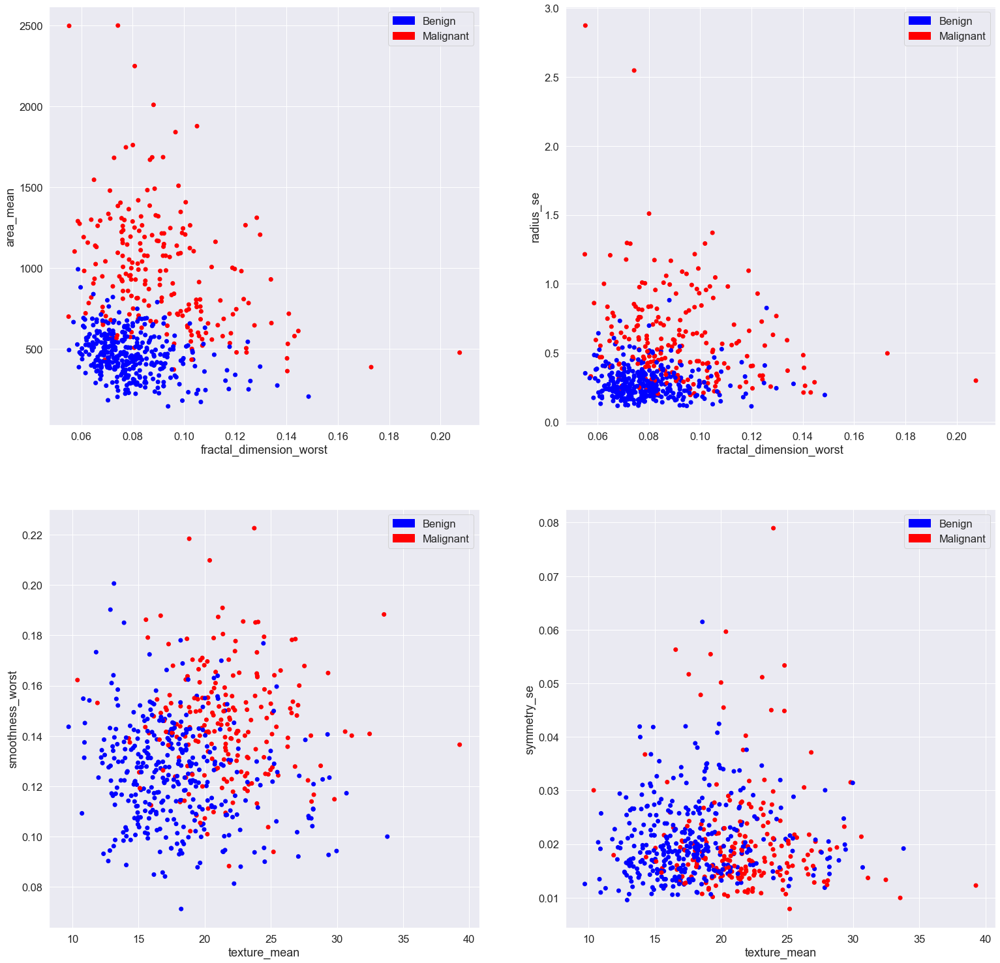

In [20]:
sb.set(font_scale=1.5)  #font size of coloumns and rows
f, axes = plt.subplots(2, 2, figsize=(26 ,26))

axes[0, 0].scatter(x = "fractal_dimension_worst", y = "area_mean", cmap = 'bwr', c = 'diagnosis', data = nullcorrelation_1)
axes[0, 0].set_xlabel('fractal_dimension_worst')
axes[0, 0].set_ylabel('area_mean')
axes[0, 0].legend(handles=[benign, malignant])

axes[0, 1].scatter(x = "fractal_dimension_worst", y = "radius_se", cmap = 'bwr', c = 'diagnosis', data = nullcorrelation_2)
axes[0, 1].set_xlabel('fractal_dimension_worst')
axes[0, 1].set_ylabel('radius_se')
axes[0, 1].legend(handles=[benign, malignant])


axes[1, 0].scatter(x = "texture_mean", y = "smoothness_worst", cmap = 'bwr', c = 'diagnosis', data = nullcorrelation_3)
axes[1, 0].set_xlabel('texture_mean')
axes[1, 0].set_ylabel('smoothness_worst')
axes[1, 0].legend(handles=[benign, malignant])


axes[1, 1].scatter(x = "texture_mean", y = "symmetry_se", cmap = 'bwr', c = 'diagnosis', data = nullcorrelation_4)
axes[1, 1].set_xlabel('texture_mean')
axes[1, 1].set_ylabel('symmetry_se')
axes[1, 1].legend(handles=[benign, malignant])

The negative correlation and no correlation are not good features to be used for prediction analysis. Hence they will be removed. However, we do observe that 11 variables are especially consistent with malignant test results. The choosen parameters are as follows- radius_mean, perimeter_worst, perimeter_mean, area_worst, radius_worst, area_se, perimeter_se, radius_se, concavity_mean, concave_points_mean, area_mean. 

With these chosen parameters that correlated with themselves and malignant diagnosed patients, we can then implement our prediction models. The 6 prediction models are as follows: 
1) Decision Tree

2) Neural Network

3) Xgboost

4) Random Forest

5) Logistic Regression

6) Support Vector Machine

In [21]:
chosenV = pd.DataFrame(noid_diagnosis[["radius_mean", "perimeter_worst", "perimeter_mean", "area_worst", "radius_worst", 
                                      "area_se", "perimeter_se", "radius_se", "concavity_mean", "concave points_mean", "area_mean"]])

[Text(0.5, 0, 'radius_mean'),
 Text(1.5, 0, 'perimeter_worst'),
 Text(2.5, 0, 'perimeter_mean'),
 Text(3.5, 0, 'area_worst'),
 Text(4.5, 0, 'radius_worst'),
 Text(5.5, 0, 'area_se'),
 Text(6.5, 0, 'perimeter_se'),
 Text(7.5, 0, 'radius_se'),
 Text(8.5, 0, 'concavity_mean'),
 Text(9.5, 0, 'concave points_mean'),
 Text(10.5, 0, 'area_mean')]

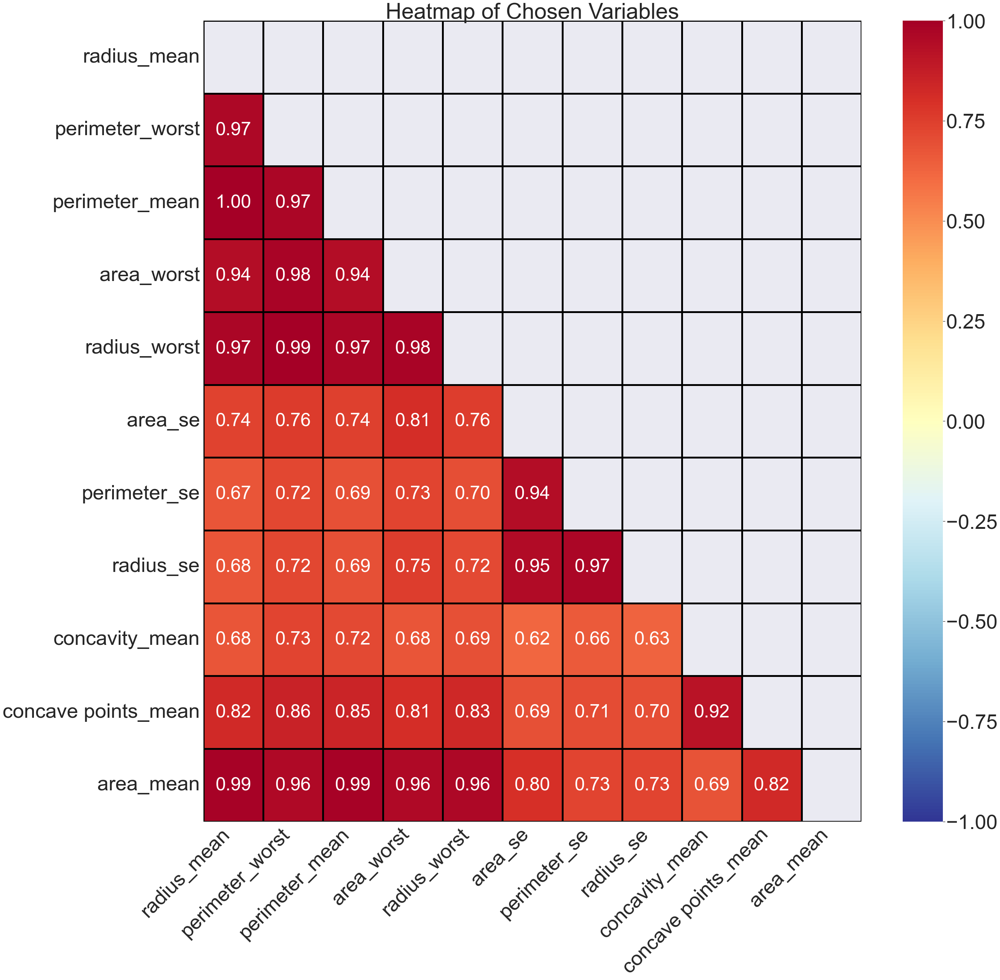

In [22]:
# Heatmap of the Correlation Matrix
sb.set(font_scale=5)  #font size of coloumns and rows

f, axes = plt.subplots(1, 1, figsize=(40, 40))
mask = np.triu(np.ones_like(chosenV.corr()))


all_heatmap = sb.heatmap(chosenV.corr(),mask= mask, vmin = -1, vmax = 1, linewidths = 5, linecolor = 'black',
           annot = True, fmt = ".2f", annot_kws = {"size": 50}, cmap = "RdYlBu_r")
all_heatmap.set_title("Heatmap of Chosen Variables")
all_heatmap.set_xticklabels(all_heatmap.get_xticklabels(),rotation=45, horizontalalignment='right')

Before we dive into our prediction models. We would need to to a training and test split. Based on the standard practice, 
we should also normalise our data. 

In statistics and applications of statistics, normalization can have a range of meanings.[1] In the simplest cases, normalization of ratings means adjusting values measured on different scales to a notionally common scale, often prior to averaging. In more complicated cases, normalization may refer to more sophisticated adjustments where the intention is to bring the entire probability distributions of adjusted values into alignment.
https://en.wikipedia.org/wiki/Normalization_(statistics)

In [23]:
print(chosenV.describe().T)

                     count        mean         std       min        25%  \
radius_mean          569.0   14.127292    3.524049    6.9810   11.70000   
perimeter_worst      569.0  107.261213   33.602542   50.4100   84.11000   
perimeter_mean       569.0   91.969033   24.298981   43.7900   75.17000   
area_worst           569.0  880.583128  569.356993  185.2000  515.30000   
radius_worst         569.0   16.269190    4.833242    7.9300   13.01000   
area_se              569.0   40.337079   45.491006    6.8020   17.85000   
perimeter_se         569.0    2.866059    2.021855    0.7570    1.60600   
radius_se            569.0    0.405172    0.277313    0.1115    0.23240   
concavity_mean       569.0    0.088799    0.079720    0.0000    0.02956   
concave points_mean  569.0    0.048919    0.038803    0.0000    0.02031   
area_mean            569.0  654.889104  351.914129  143.5000  420.30000   

                           50%        75%        max  
radius_mean           13.37000    15.7800   

In [24]:
#Scale / normalize the values to bring them to similar range
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(chosenV)
X = scaler.transform(chosenV) #X is now a chosenV transformed of normalised values (Predictors)

y = diagnosisdata.values #Response
print("Labels before encoding are: ", np.unique(y))
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
Y = labelencoder.fit_transform(y)

Labels before encoding are:  ['Benign' 'Malignant']


C:\Users\jjont\anaconda3\lib\site-packages\sklearn\preprocessing\_label.py:115: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [25]:
print("Labels after encoding are: ", np.unique(Y))


Labels after encoding are:  [0 1]


In [26]:
chosenV = pd.DataFrame(noid_diagnosis[["radius_mean", "perimeter_worst", "perimeter_mean", "area_worst", "radius_worst", 
                                      "area_se", "perimeter_se", "radius_se", "concavity_mean", "concave points_mean", "area_mean"]])

Basically what the labelEncoder does is that it changes B and M to '0' and '1' 

**Training of Data, these parameters will be used consistently for the various 6 prediction models**

The dataset will be split into 3 types. Training, Validation and Test 

Note to self: X is chosenV, Y is encoded [0,1] of diagnosis results.

In [27]:
from sklearn.model_selection import train_test_split

train_ratio = 0.75
validation_ratio = 0.15
test_ratio = 0.10

# train is now 75% of the entire data set
# the _junk suffix means that we drop that variable completely

x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size= 1 - train_ratio) #test size = 0.25

# test is now 10% of the initial data set
# validation is now 15% of the initial data set

x_val, x_test, y_val, y_test = train_test_split(x_test, y_test, test_size=test_ratio/(test_ratio + validation_ratio)) 

What the top code means is x_train, x_val and x_test are respective representations we need.

Prediction Model

In this section, we will be using 6 different types of prediction model before we conclude on the various accuracies. 

**Definition**

True Positives (TP) - correctly identified as Malignant

True Negatives (TN) - correctly identified as Benign

False Positives (FP) - Benign incorrectly identified as Malignant

False Negatives (FN) - Malignant incorrectly identified as Benign

**4 Parameters are used to evaluate the ROC Curve:**

Accuracy (ratio of correctly predicted oberservations to total observations) = TP+TN/TP+FP+FN+TN

Precision (Ratio of correctly predicited positive observation to total predicited observations aka low false positive rate) = TP/TP+FP

Recall (ratio of correctly predicted positive observations to the all observations in actual class) = TP/TP+FN

F1 Score (weighted average of Precision and Recall) = 2(Recall Precision) / (Recall + Precision)

**Decision Tree**

As learnt from our tutorial work, Decision tree is capable of classifying itself depending on many variables. . We can try to improve and optimise performance by changing other parameters such as max_leaf_nodes, minimum_sample_split and min_sample_leaf etc. However, for this project, we will only try to optimise the Decision tree capability using only Depth Of Tree. 

In [28]:
# Import essential models and functions from sklearn
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

In [29]:
train_accuracy = []
val_accuracy = []

for depth in range (1,12): #We choosen a random number 30 to represent "maximum" depth
    dectree = DecisionTreeClassifier(max_depth = depth) #Loop from 1 to 30 depth
    dectree.fit(x_train, y_train)
    train_accuracy.append(dectree.score(x_train, y_train))
    val_accuracy.append(dectree.score(x_val, y_val))

In [30]:
dectree.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=11)

In [31]:
dectree.score(x_train, y_train) #Checking the training set score

1.0

In [32]:
dectree.score(x_val, y_val) #Checking the validation set score

0.9294117647058824

In [33]:
dectree.predict_proba(x_val) #Predictions on validation set

array([[1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [1., 0.],
       [1., 0.

In [34]:
y_pred = dectree.predict_proba(x_val) [:,1] #Set variable of the first column 

In [35]:
new_y = [] 
for i in range(len(y_pred)):
    if y_pred[i] <0.5:
        new_y.append("Benign")
    else:
        new_y.append('Malignant')
        
#although the underlying table is shown to be 0 and 1, we cannot confirm that there is pressence of 0.5, hence i set the parameter this way

In [36]:
treeframe = pd.DataFrame({'max_depth': range(1,12), 'train_acc': train_accuracy, 'val_acc':val_accuracy})

Text(0, 0.5, 'Performance')

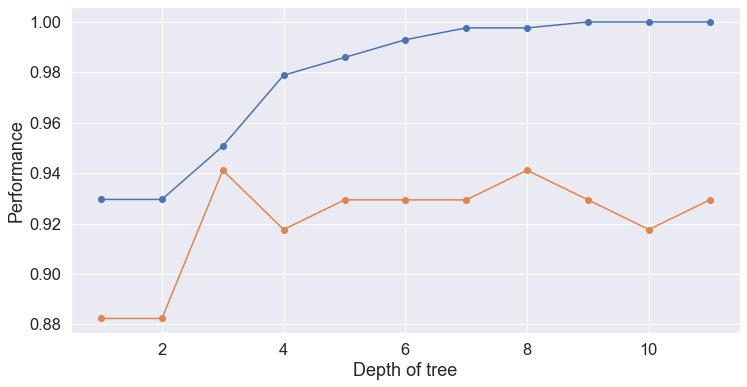

In [37]:
sb.set(font_scale = 1.5)
plt.figure(figsize = (12,6))
plt.plot(treeframe['max_depth'], treeframe['train_acc'], marker ='o')
plt.plot(treeframe['max_depth'], treeframe['val_acc'], marker = 'o')
plt.xlabel('Depth of tree')
plt.ylabel('Performance') 


Keeping a low value of max depth, we will not allow the model to learn the patterns and get a low performance (underfitting).
In this case, the max depth of 8 produces the highest validation accuracy.

In [38]:
# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 8)  # create the decision tree object
dectree.fit(x_train, y_train)                    # train the decision tree model

# Predict Response corresponding to Predictors
y_train_pred = dectree.predict(x_train)
y_val_pred = dectree.predict(x_val)

In [39]:
# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(x_train, y_train))
print()

# Check the Goodness of Fit (on Validation Data)
print("Goodness of Fit of Model \tValidation Dataset")
print("Classification Accuracy \t:", dectree.score(x_val, y_val))
print()

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9976525821596244

Goodness of Fit of Model 	Validation Dataset
Classification Accuracy 	: 0.9294117647058824



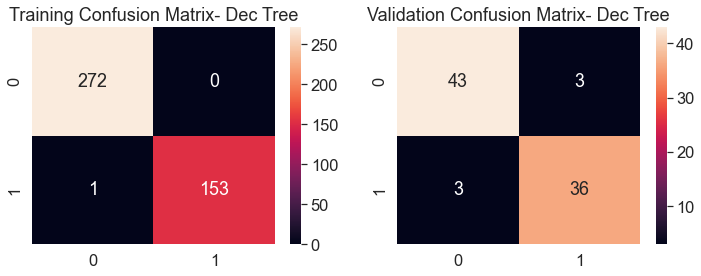

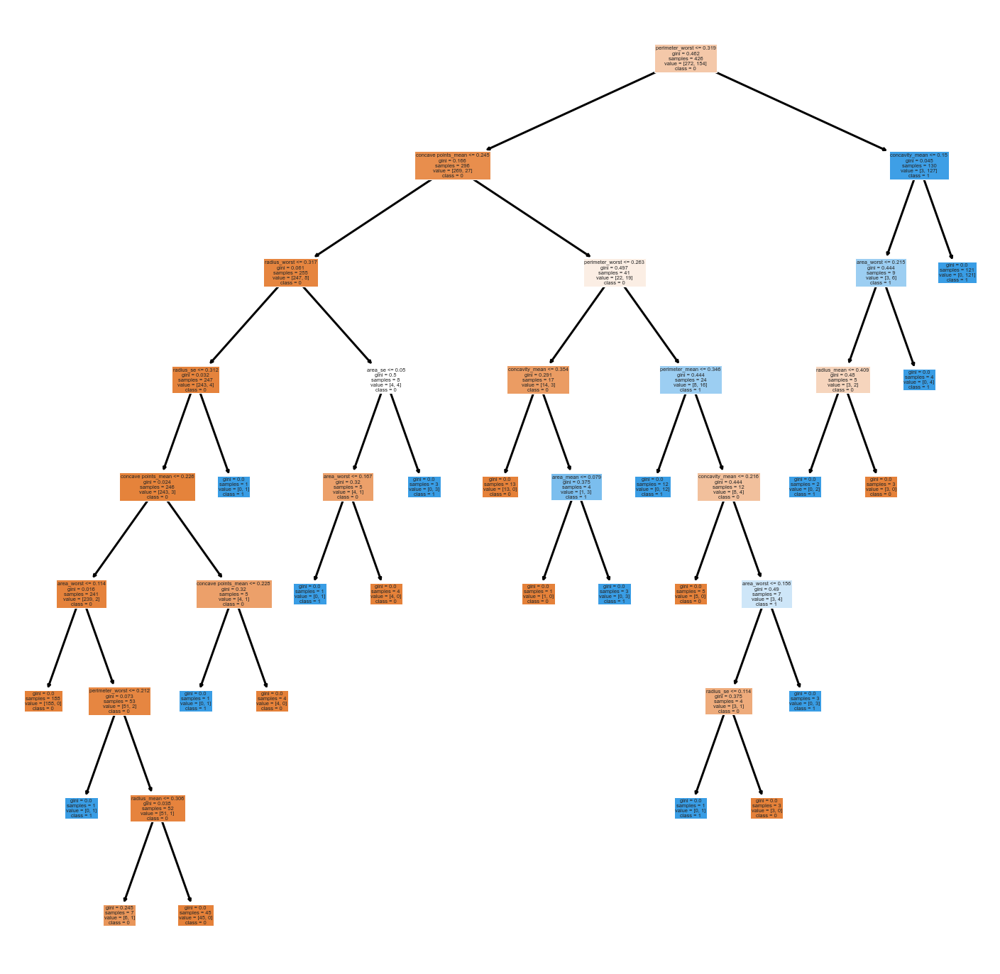

In [40]:
from sklearn.tree import plot_tree
from sklearn.tree import plot_tree

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))


decTrain = sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
decTrain.set_title('Training Confusion Matrix- Dec Tree')

cm_val_DT = confusion_matrix(y_val, y_val_pred)
decVal = sb.heatmap(cm_val_DT , 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])
decVal.set_title('Validation Confusion Matrix- Dec Tree')

fig, ax = plt.subplots(figsize=(25, 25))
out = plot_tree(dectree, 
          feature_names = chosenV.columns,
          class_names = [str(x) for x in dectree.classes_],
          filled=True)

for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(3)
      
      
plt.show()


**Neural Network**

In [41]:
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout

Input Layer: Number of Variable inputs Output Layer: Number of Possible Outputs (M or B) Neural network with no hidden layer is just a linear model. (Linear Regression)

When do we need hidden layers? -f the data set is linear, you could just use linear regression. if the data has no correlation, you can use Neural network.

Correct answer: Using the best fit. Too many hidden layers will lead to overfitting. 0 - only capable of representing linear separable functions or decisions 1- can approximate any dunction that contains continous mapping from one fnite space to another 2- can represent an arbitrary accuracy with rational activation functions and can approximate any smooth mapping to any accuracy.

In [42]:
model = Sequential()
model.add(Dense(16, input_dim=11, activation='relu')) 
#input_dim should be 11 as there are only determined correlated var

model.add(Dense(1)) 
model.add(Activation('sigmoid')) 
 
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

#Adam has no need to adjust the hyperparameters. 
#Entropy is the degree of disorder or randomness in the system
#Croess entropy is the measure of the difference between 2 probability distributions

print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16)                192       
                                                                 
 dense_1 (Dense)             (None, 1)                 17        
                                                                 
 activation (Activation)     (None, 1)                 0         
                                                                 
Total params: 209
Trainable params: 209
Non-trainable params: 0
_________________________________________________________________
None


Dropout is used to minimise overfitting. Neural networks trained on relatively small datasets can overfit training data. Dropout approximates training a large number of neural networks with different architectres in parallel. During training, some number of layer outputs are randomly ignored or "dropped out".

In [43]:
#Fit with no early stopping or other callbacks
history = model.fit(x_train, y_train, verbose=1, epochs=150, batch_size=100, 
                    validation_data=(x_val, y_val))

#verbose is just to show progress bar when set =1

Epoch 1/150
5/5 [==============================] - 1s 38ms/step - loss: 0.7000 - accuracy: 0.6315 - val_loss: 0.7055 - val_accuracy: 0.5412
Epoch 2/150
5/5 [==============================] - 0s 5ms/step - loss: 0.6937 - accuracy: 0.6315 - val_loss: 0.6983 - val_accuracy: 0.5412
Epoch 3/150
5/5 [==============================] - 0s 4ms/step - loss: 0.6879 - accuracy: 0.6315 - val_loss: 0.6905 - val_accuracy: 0.5412
Epoch 4/150
5/5 [==============================] - 0s 5ms/step - loss: 0.6821 - accuracy: 0.6549 - val_loss: 0.6830 - val_accuracy: 0.6588
Epoch 5/150
5/5 [==============================] - 0s 5ms/step - loss: 0.6765 - accuracy: 0.7676 - val_loss: 0.6760 - val_accuracy: 0.7882
Epoch 6/150
5/5 [==============================] - 0s 5ms/step - loss: 0.6708 - accuracy: 0.8685 - val_loss: 0.6693 - val_accuracy: 0.8588
Epoch 7/150
5/5 [==============================] - 0s 5ms/step - loss: 0.6652 - accuracy: 0.9108 - val_loss: 0.6631 - val_accuracy: 0.9294
Epoch 8/150
5/5 [=========

5/5 [==============================] - 0s 5ms/step - loss: 0.3251 - accuracy: 0.9272 - val_loss: 0.3414 - val_accuracy: 0.9412
Epoch 60/150
5/5 [==============================] - 0s 5ms/step - loss: 0.3208 - accuracy: 0.9225 - val_loss: 0.3382 - val_accuracy: 0.9412
Epoch 61/150
5/5 [==============================] - 0s 5ms/step - loss: 0.3166 - accuracy: 0.9225 - val_loss: 0.3341 - val_accuracy: 0.9412
Epoch 62/150
5/5 [==============================] - 0s 5ms/step - loss: 0.3126 - accuracy: 0.9249 - val_loss: 0.3299 - val_accuracy: 0.9412
Epoch 63/150
5/5 [==============================] - 0s 5ms/step - loss: 0.3085 - accuracy: 0.9249 - val_loss: 0.3262 - val_accuracy: 0.9412
Epoch 64/150
5/5 [==============================] - 0s 5ms/step - loss: 0.3047 - accuracy: 0.9272 - val_loss: 0.3222 - val_accuracy: 0.9412
Epoch 65/150
5/5 [==============================] - 0s 5ms/step - loss: 0.3009 - accuracy: 0.9272 - val_loss: 0.3186 - val_accuracy: 0.9412
Epoch 66/150
5/5 [===============

5/5 [==============================] - 0s 5ms/step - loss: 0.1946 - accuracy: 0.9366 - val_loss: 0.2213 - val_accuracy: 0.9529
Epoch 118/150
5/5 [==============================] - 0s 5ms/step - loss: 0.1936 - accuracy: 0.9343 - val_loss: 0.2206 - val_accuracy: 0.9529
Epoch 119/150
5/5 [==============================] - 0s 5ms/step - loss: 0.1926 - accuracy: 0.9343 - val_loss: 0.2197 - val_accuracy: 0.9529
Epoch 120/150
5/5 [==============================] - 0s 5ms/step - loss: 0.1916 - accuracy: 0.9343 - val_loss: 0.2187 - val_accuracy: 0.9529
Epoch 121/150
5/5 [==============================] - 0s 5ms/step - loss: 0.1906 - accuracy: 0.9390 - val_loss: 0.2178 - val_accuracy: 0.9529
Epoch 122/150
5/5 [==============================] - 0s 5ms/step - loss: 0.1897 - accuracy: 0.9390 - val_loss: 0.2169 - val_accuracy: 0.9529
Epoch 123/150
5/5 [==============================] - 0s 5ms/step - loss: 0.1889 - accuracy: 0.9413 - val_loss: 0.2161 - val_accuracy: 0.9529
Epoch 124/150
5/5 [========

Batch size defines the number of samples that propagate through the network before updating the model parameter. 
(Forward and backward propagation)

example 3000 images, batch size =32 epochs = 500 
32 samples will be taken at a time to train the network
to go through all 3000 images it takes 3000/32 = 94 iterations = 1 epoch 
this process contain 500 epochs. 

Small or large batch size is dependable on your system hardware (ram +GPU) 
smaller batches mean each step in gradient descent may be less accurate, so it takes longer for the algorithm to converge. 

Larger batchs means there is a significant degradation in the quality to of the model.
Good starting point is 32 or 64. 

Doing multiple fits consecutively will only show the saturation results. 

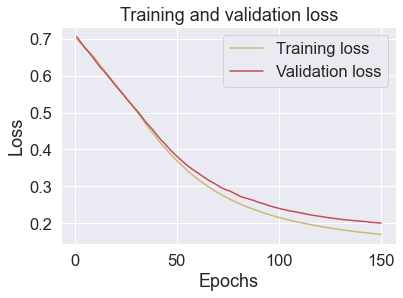

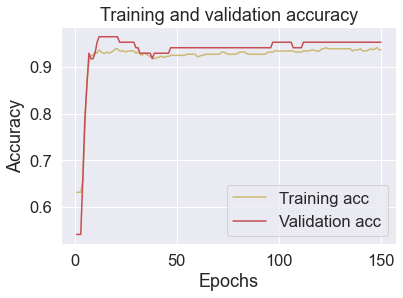

In [44]:
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


acc = history.history['accuracy']  #Use accuracy if acc doesn't work
val_acc = history.history['val_accuracy']  #Use val_accuracy if acc doesn't work
plt.plot(epochs, acc, 'y', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()
sb.set(font_scale=1.5)

3/3 [==============================] - 0s 1ms/step


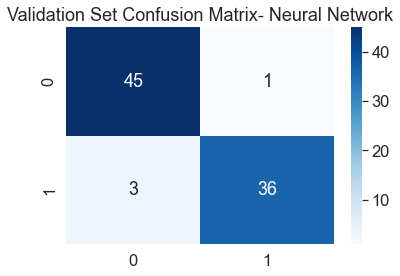

In [45]:
# Predicting the Test set results
y_pred = model.predict(x_val)
y_pred = (y_pred > 0.5)


# Making the Confusion Matrix
cm_val_NN= confusion_matrix(y_val, y_pred)

test_heatmap = sb.heatmap(cm_val_NN, annot=True, fmt="d", cmap='Blues')
test_heatmap.set_title('Validation Set Confusion Matrix- Neural Network')
sb.set(font_scale=1.5)

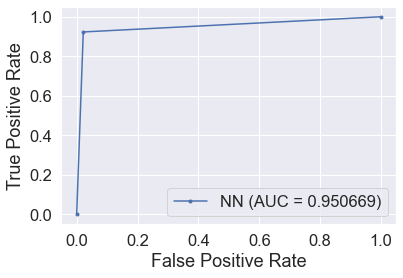

In [46]:
from sklearn.metrics import roc_curve, auc

nn_fpr_keras, nn_tpr_keras, nn_thresholds_keras = roc_curve(y_val, y_pred)
auc_keras = auc(nn_fpr_keras, nn_tpr_keras)
plt.plot(nn_fpr_keras, nn_tpr_keras, marker='.', label='NN (AUC = %0.6f)' % auc_keras)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.legend(loc=4)
sb.set(font_scale=1.5)

**xgBoost**
(extreme Gradient Boosted Trees)
Features: Regularized boosting (preventing overfitting), able to handle missing values automatically, can cross validate at each iteration. (Enable early stopping, finding optimal number of iteraration), support incremental training.

https://www.kaggle.com/code/prashant111/xgboost-k-fold-cv-feature-importance/notebook

https://www.kaggle.com/code/prashant111/a-guide-on-xgboost-hyperparameters-tuning/notebook

https://towardsdatascience.com/beginners-guide-to-xgboost-for-classification-problems-50f75aac5390

In [47]:
# import XGBClassifier
from xgboost import XGBClassifier

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [48]:
# declare parameters
params = {  'max_depth': 4,
            'alpha': 10,
            'learning_rate': 1.0,
        }   #Random perimeters set up  

# instantiate the classifier 
xgb_clf = XGBClassifier(**params)


# fit the classifier to the training data
xgb_clf.fit(x_train, y_train) #x_train and y_train are pre-split training and test data used earlier

[23:16:05] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


XGBClassifier(alpha=10, base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=1.0, max_delta_step=0,
              max_depth=4, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=12,
              num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=10, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [49]:
# we can view the parameters of the xgb trained model as follows -

print(xgb_clf)

XGBClassifier(alpha=10, base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=1.0, max_delta_step=0,
              max_depth=4, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=12,
              num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=10, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)


In [50]:
# make predictions on test data

y_pred = xgb_clf.predict(x_val)

In [51]:
print('XGBoost model accuracy score: {0:0.4f}'. format(accuracy_score(y_val, y_pred)))

XGBoost model accuracy score: 0.9647


A Guide on XGBoost hyperparameters tuning

In [52]:
# import machine learning libraries
import xgboost as xgb

# import packages for hyperparameters tuning
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe

#Initialize domain space for range of values 

space={'max_depth': hp.quniform("max_depth", 3, 5, 1),
        'gamma': hp.uniform ('gamma', 0.1,3),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 5, 1),
        'n_estimators': 10,
        'seed': 0
    }

In [53]:
def objective(space):
    clf=xgb.XGBClassifier(
                    n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'], min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']))
    
    evaluation = [( x_train, y_train), ( x_val, y_val)]
    
    clf.fit(x_train, y_train,
            eval_set=evaluation, eval_metric="auc",
            early_stopping_rounds=10,verbose=True)
    

    pred = clf.predict(x_val)
    accuracy = accuracy_score(y_val, pred>0.5)
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }

In [54]:
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 100,
                        trials = trials)

[0]	validation_0-auc:0.87486	validation_1-auc:0.87486  
[1]	validation_0-auc:0.95105	validation_1-auc:0.91890  
[2]	validation_0-auc:0.97666	validation_1-auc:0.97241  
[3]	validation_0-auc:0.98118	validation_1-auc:0.98411  
[4]	validation_0-auc:0.98461	validation_1-auc:0.98411  
[5]	validation_0-auc:0.98483	validation_1-auc:0.97659  
[6]	validation_0-auc:0.98663	validation_1-auc:0.97603  
[7]	validation_0-auc:0.98719	validation_1-auc:0.97436  
[8]	validation_0-auc:0.98944	validation_1-auc:0.97882  
[9]	validation_0-auc:0.99056	validation_1-auc:0.98049  
SCORE:                                                 
0.8941176470588236                                     
[0]	validation_0-auc:0.87110	validation_1-auc:0.88322  
[1]	validation_0-auc:0.95013	validation_1-auc:0.92280                             
[2]	validation_0-auc:0.97604	validation_1-auc:0.96879                             
[3]	validation_0-auc:0.97971	validation_1-auc:0.98579                             
[4]	validation_0-auc:0.

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[2]	validation_0-auc:0.97413	validation_1-auc:0.97631                             
[3]	validation_0-auc:0.97812	validation_1-auc:0.98857                             
[4]	validation_0-auc:0.98200	validation_1-auc:0.98551                             
[5]	validation_0-auc:0.98163	validation_1-auc:0.98188                             
[6]	validation_0-auc:0.98328	validation_1-auc:0.98105                             
[7]	validation_0-auc:0.98353	validation_1-auc:0.97854                             
[8]	validation_0-auc:0.98360	validation_1-auc:0.98188                             
[9]	validation_0-auc:0.98518	validation_1-auc:0.98216                             
SCORE:                                                                            
0.9058823529411765                                                                
[0]	validation_0-auc:0.87110	validation_1-auc:0.88322                             
[1]	validation_0-auc:0.94843	validation_1-auc:0.91834                             
[2]	

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[2]	validation_0-auc:0.97595	validation_1-auc:0.96879                             
[3]	validation_0-auc:0.97953	validation_1-auc:0.98579                             
[4]	validation_0-auc:0.98206	validation_1-auc:0.98356                             
[5]	validation_0-auc:0.98190	validation_1-auc:0.97742                             
[6]	validation_0-auc:0.98364	validation_1-auc:0.97464                             
[7]	validation_0-auc:0.98433	validation_1-auc:0.97408                             
[8]	validation_0-auc:0.98520	validation_1-auc:0.97575                             
[9]	validation_0-auc:0.98665	validation_1-auc:0.98133                             
SCORE:                                                                            
0.8941176470588236                                                                
[0]	validation_0-auc:0.87270	validation_1-auc:0.88155                             
[1]	validation_0-auc:0.95085	validation_1-auc:0.92280                              
[2]

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[3]	validation_0-auc:0.98165	validation_1-auc:0.98746
[4]	validation_0-auc:0.98409	validation_1-auc:0.98523                              
[5]	validation_0-auc:0.98297	validation_1-auc:0.98021                              
[6]	validation_0-auc:0.98509	validation_1-auc:0.97993                              
[7]	validation_0-auc:0.98538	validation_1-auc:0.97631                              
[8]	validation_0-auc:0.98682	validation_1-auc:0.98105                              
[9]	validation_0-auc:0.98806	validation_1-auc:0.98439                              
SCORE:                                                                             
0.8941176470588236                                                                 
[0]	validation_0-auc:0.87475	validation_1-auc:0.87737                              
[1]	validation_0-auc:0.95026	validation_1-auc:0.91778                              
[2]	validation_0-auc:0.97762	validation_1-auc:0.97324                              
[3]	validation_0-auc:0

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[1]	validation_0-auc:0.94941	validation_1-auc:0.91472                              
[2]	validation_0-auc:0.97456	validation_1-auc:0.96879                              
[3]	validation_0-auc:0.97901	validation_1-auc:0.98467                              
[4]	validation_0-auc:0.98190	validation_1-auc:0.98356                              
[5]	validation_0-auc:0.98116	validation_1-auc:0.97798                              
[6]	validation_0-auc:0.98311	validation_1-auc:0.97575                              
[7]	validation_0-auc:0.98328	validation_1-auc:0.97520                              
[8]	validation_0-auc:0.98408	validation_1-auc:0.97575                              
[9]	validation_0-auc:0.98594	validation_1-auc:0.97910                              
SCORE:                                                                             
0.8941176470588236                                                                 
[0]	validation_0-auc:0.87110	validation_1-auc:0.88322                       

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[2]	validation_0-auc:0.97413	validation_1-auc:0.97631                              
[3]	validation_0-auc:0.97812	validation_1-auc:0.98857                              
[4]	validation_0-auc:0.98202	validation_1-auc:0.98606                              
[5]	validation_0-auc:0.98155	validation_1-auc:0.98188                              
[6]	validation_0-auc:0.98331	validation_1-auc:0.98105                              
[7]	validation_0-auc:0.98320	validation_1-auc:0.97854                              
[8]	validation_0-auc:0.98338	validation_1-auc:0.98188                              
[9]	validation_0-auc:0.98478	validation_1-auc:0.98188                              
SCORE:                                                                             
0.9058823529411765                                                                 
[0]	validation_0-auc:0.87110	validation_1-auc:0.88322                              
[1]	validation_0-auc:0.94843	validation_1-auc:0.91834                       

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87110	validation_1-auc:0.88322                              
[1]	validation_0-auc:0.95013	validation_1-auc:0.92280                              
[2]	validation_0-auc:0.97559	validation_1-auc:0.96656                              
[3]	validation_0-auc:0.97997	validation_1-auc:0.98579                              
[4]	validation_0-auc:0.98227	validation_1-auc:0.98467                              
[5]	validation_0-auc:0.98193	validation_1-auc:0.97798                              
[6]	validation_0-auc:0.98353	validation_1-auc:0.97687                              
[7]	validation_0-auc:0.98422	validation_1-auc:0.97380                              
[8]	validation_0-auc:0.98427	validation_1-auc:0.97659                              
[9]	validation_0-auc:0.98606	validation_1-auc:0.98216                              
SCORE:                                                                             
0.8941176470588236                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87110	validation_1-auc:0.88322                              
[1]	validation_0-auc:0.94843	validation_1-auc:0.91834                              
[2]	validation_0-auc:0.97413	validation_1-auc:0.97631                              
[3]	validation_0-auc:0.97898	validation_1-auc:0.98913                              
[4]	validation_0-auc:0.98270	validation_1-auc:0.98606                              
[5]	validation_0-auc:0.98252	validation_1-auc:0.98049                              
[6]	validation_0-auc:0.98402	validation_1-auc:0.97965                              
[7]	validation_0-auc:0.98424	validation_1-auc:0.97770                              
[8]	validation_0-auc:0.98404	validation_1-auc:0.98049                              
[9]	validation_0-auc:0.98521	validation_1-auc:0.98049                              
SCORE:                                                                             
0.8941176470588236                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87110	validation_1-auc:0.88322                              
[1]	validation_0-auc:0.94843	validation_1-auc:0.91834                              
[2]	validation_0-auc:0.97413	validation_1-auc:0.97631                              
[3]	validation_0-auc:0.97812	validation_1-auc:0.98857                              
[4]	validation_0-auc:0.98200	validation_1-auc:0.98551                              
[5]	validation_0-auc:0.98163	validation_1-auc:0.98188                              
[6]	validation_0-auc:0.98328	validation_1-auc:0.98105                              
[7]	validation_0-auc:0.98353	validation_1-auc:0.97854                              
[8]	validation_0-auc:0.98360	validation_1-auc:0.98188                              
[9]	validation_0-auc:0.98482	validation_1-auc:0.98188                              
SCORE:                                                                             
0.9058823529411765                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87585	validation_1-auc:0.88322                              
[1]	validation_0-auc:0.95149	validation_1-auc:0.91945                              
[2]	validation_0-auc:0.97977	validation_1-auc:0.97436                              
[3]	validation_0-auc:0.98664	validation_1-auc:0.98774                              
[4]	validation_0-auc:0.98805	validation_1-auc:0.98551                              
[5]	validation_0-auc:0.98781	validation_1-auc:0.98021                              
[6]	validation_0-auc:0.98944	validation_1-auc:0.97882                              
[7]	validation_0-auc:0.98967	validation_1-auc:0.97715                              
[8]	validation_0-auc:0.99093	validation_1-auc:0.98105                              
[9]	validation_0-auc:0.99184	validation_1-auc:0.98160                              
SCORE:                                                                             
0.9058823529411765                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87691	validation_1-auc:0.87876                              
[1]	validation_0-auc:0.95179	validation_1-auc:0.91778                              
[2]	validation_0-auc:0.97681	validation_1-auc:0.96823                              
[3]	validation_0-auc:0.98017	validation_1-auc:0.98467                              
[4]	validation_0-auc:0.98260	validation_1-auc:0.98356                              
[5]	validation_0-auc:0.98298	validation_1-auc:0.97631                              
[6]	validation_0-auc:0.98459	validation_1-auc:0.97631                              
[7]	validation_0-auc:0.98507	validation_1-auc:0.97464                              
[8]	validation_0-auc:0.98569	validation_1-auc:0.97659                              
[9]	validation_0-auc:0.98736	validation_1-auc:0.98216                              
SCORE:                                                                             
0.8941176470588236                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87585	validation_1-auc:0.88322                              
[1]	validation_0-auc:0.95149	validation_1-auc:0.91945                              
[2]	validation_0-auc:0.97977	validation_1-auc:0.97436                              
[3]	validation_0-auc:0.98716	validation_1-auc:0.98690                              
[4]	validation_0-auc:0.98840	validation_1-auc:0.98411                              
[5]	validation_0-auc:0.98848	validation_1-auc:0.97910                              
[6]	validation_0-auc:0.99037	validation_1-auc:0.97715                              
[7]	validation_0-auc:0.99077	validation_1-auc:0.97603                              
[8]	validation_0-auc:0.99188	validation_1-auc:0.97993                              
[9]	validation_0-auc:0.99250	validation_1-auc:0.98216                              
SCORE:                                                                             
0.8941176470588236                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87110	validation_1-auc:0.88322                              
[1]	validation_0-auc:0.94843	validation_1-auc:0.91834                              
[2]	validation_0-auc:0.97413	validation_1-auc:0.97631                              
[3]	validation_0-auc:0.97898	validation_1-auc:0.98913                              
[4]	validation_0-auc:0.98270	validation_1-auc:0.98606                              
[5]	validation_0-auc:0.98252	validation_1-auc:0.98049                              
[6]	validation_0-auc:0.98402	validation_1-auc:0.97965                              
[7]	validation_0-auc:0.98424	validation_1-auc:0.97770                              
[8]	validation_0-auc:0.98496	validation_1-auc:0.98133                              
[9]	validation_0-auc:0.98611	validation_1-auc:0.98133                              
SCORE:                                                                             
0.8941176470588236                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87672	validation_1-auc:0.87876                              
[1]	validation_0-auc:0.95099	validation_1-auc:0.91834                              
[2]	validation_0-auc:0.97656	validation_1-auc:0.96879                              
[3]	validation_0-auc:0.97983	validation_1-auc:0.98467                              
[4]	validation_0-auc:0.98236	validation_1-auc:0.98356                              
[5]	validation_0-auc:0.98169	validation_1-auc:0.97687                              
[6]	validation_0-auc:0.98375	validation_1-auc:0.97826                              
[7]	validation_0-auc:0.98438	validation_1-auc:0.97464                              
[8]	validation_0-auc:0.98589	validation_1-auc:0.97826                              
[9]	validation_0-auc:0.98708	validation_1-auc:0.98328                              
SCORE:                                                                             
0.8941176470588236                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87110	validation_1-auc:0.88322                              
[1]	validation_0-auc:0.95013	validation_1-auc:0.92280                              
[2]	validation_0-auc:0.97629	validation_1-auc:0.97046                              
[3]	validation_0-auc:0.98001	validation_1-auc:0.98634                              
[4]	validation_0-auc:0.98237	validation_1-auc:0.98356                              
[5]	validation_0-auc:0.98167	validation_1-auc:0.97742                              
[6]	validation_0-auc:0.98343	validation_1-auc:0.97520                              
[7]	validation_0-auc:0.98405	validation_1-auc:0.97408                              
[8]	validation_0-auc:0.98577	validation_1-auc:0.97770                              
[9]	validation_0-auc:0.98704	validation_1-auc:0.98272                              
SCORE:                                                                             
0.8941176470588236                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87672	validation_1-auc:0.87876                              
[1]	validation_0-auc:0.95099	validation_1-auc:0.91834                              
[2]	validation_0-auc:0.97656	validation_1-auc:0.96879                              
[3]	validation_0-auc:0.97983	validation_1-auc:0.98467                              
[4]	validation_0-auc:0.98236	validation_1-auc:0.98356                              
[5]	validation_0-auc:0.98230	validation_1-auc:0.97687                              
[6]	validation_0-auc:0.98432	validation_1-auc:0.97826                              
[7]	validation_0-auc:0.98486	validation_1-auc:0.97464                              
[8]	validation_0-auc:0.98630	validation_1-auc:0.97826                              
[9]	validation_0-auc:0.98740	validation_1-auc:0.98272                              
SCORE:                                                                             
0.8941176470588236                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87110	validation_1-auc:0.88322                              
[1]	validation_0-auc:0.95013	validation_1-auc:0.92280                              
[2]	validation_0-auc:0.97651	validation_1-auc:0.97547                              
[3]	validation_0-auc:0.98081	validation_1-auc:0.98662                              
[4]	validation_0-auc:0.98346	validation_1-auc:0.98328                              
[5]	validation_0-auc:0.98361	validation_1-auc:0.97882                              
[6]	validation_0-auc:0.98521	validation_1-auc:0.97826                              
[7]	validation_0-auc:0.98576	validation_1-auc:0.97715                              
[8]	validation_0-auc:0.98685	validation_1-auc:0.97910                              
[9]	validation_0-auc:0.98876	validation_1-auc:0.98133                              
SCORE:                                                                             
0.8823529411764706                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87234	validation_1-auc:0.88155                              
[1]	validation_0-auc:0.95056	validation_1-auc:0.92280                              
[2]	validation_0-auc:0.97663	validation_1-auc:0.96990                              
[3]	validation_0-auc:0.98059	validation_1-auc:0.98662                              
[4]	validation_0-auc:0.98284	validation_1-auc:0.98272                              
[5]	validation_0-auc:0.98386	validation_1-auc:0.97547                              
[6]	validation_0-auc:0.98545	validation_1-auc:0.97520                              
[7]	validation_0-auc:0.98650	validation_1-auc:0.97408                              
[8]	validation_0-auc:0.98769	validation_1-auc:0.97770                              
[9]	validation_0-auc:0.98891	validation_1-auc:0.98160                              
SCORE:                                                                             
0.8941176470588236                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87585	validation_1-auc:0.88322                              
[1]	validation_0-auc:0.95025	validation_1-auc:0.91834                              
[2]	validation_0-auc:0.97716	validation_1-auc:0.97659                              
[3]	validation_0-auc:0.98513	validation_1-auc:0.98997                              
[4]	validation_0-auc:0.98730	validation_1-auc:0.98634                              
[5]	validation_0-auc:0.98606	validation_1-auc:0.98188                              
[6]	validation_0-auc:0.98703	validation_1-auc:0.97742                              
[7]	validation_0-auc:0.98701	validation_1-auc:0.97659                              
[8]	validation_0-auc:0.98794	validation_1-auc:0.98133                              
[9]	validation_0-auc:0.98930	validation_1-auc:0.98021                              
SCORE:                                                                             
0.9058823529411765                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87110	validation_1-auc:0.88322                              
[1]	validation_0-auc:0.94843	validation_1-auc:0.91834                              
[2]	validation_0-auc:0.97413	validation_1-auc:0.97631                              
[3]	validation_0-auc:0.97898	validation_1-auc:0.98913                              
[4]	validation_0-auc:0.98270	validation_1-auc:0.98606                              
[5]	validation_0-auc:0.98252	validation_1-auc:0.98049                              
[6]	validation_0-auc:0.98402	validation_1-auc:0.97965                              
[7]	validation_0-auc:0.98424	validation_1-auc:0.97770                              
[8]	validation_0-auc:0.98496	validation_1-auc:0.98133                              
[9]	validation_0-auc:0.98611	validation_1-auc:0.98133                              
SCORE:                                                                             
0.8941176470588236                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87539	validation_1-auc:0.87737                              
[1]	validation_0-auc:0.95120	validation_1-auc:0.92057                              
[2]	validation_0-auc:0.97948	validation_1-auc:0.97882                              
[3]	validation_0-auc:0.98511	validation_1-auc:0.98662                              
[4]	validation_0-auc:0.98874	validation_1-auc:0.98662                              
[5]	validation_0-auc:0.98849	validation_1-auc:0.98105                              
[6]	validation_0-auc:0.98957	validation_1-auc:0.97492                              
[7]	validation_0-auc:0.99079	validation_1-auc:0.97715                              
[8]	validation_0-auc:0.99169	validation_1-auc:0.97770                              
[9]	validation_0-auc:0.99281	validation_1-auc:0.98049                              
SCORE:                                                                             
0.9058823529411765                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87110	validation_1-auc:0.88322                              
[1]	validation_0-auc:0.95013	validation_1-auc:0.92280                              
[2]	validation_0-auc:0.97604	validation_1-auc:0.96879                              
[3]	validation_0-auc:0.97971	validation_1-auc:0.98579                              
[4]	validation_0-auc:0.98212	validation_1-auc:0.98356                              
[5]	validation_0-auc:0.98168	validation_1-auc:0.97742                              
[6]	validation_0-auc:0.98342	validation_1-auc:0.97520                              
[7]	validation_0-auc:0.98402	validation_1-auc:0.97408                              
[8]	validation_0-auc:0.98502	validation_1-auc:0.97575                              
[9]	validation_0-auc:0.98636	validation_1-auc:0.98133                              
SCORE:                                                                             
0.8941176470588236                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87110	validation_1-auc:0.88322                              
[1]	validation_0-auc:0.95013	validation_1-auc:0.92280                              
[2]	validation_0-auc:0.97595	validation_1-auc:0.96879                              
[3]	validation_0-auc:0.97953	validation_1-auc:0.98579                              
[4]	validation_0-auc:0.98206	validation_1-auc:0.98356                              
[5]	validation_0-auc:0.98190	validation_1-auc:0.97742                              
[6]	validation_0-auc:0.98364	validation_1-auc:0.97464                              
[7]	validation_0-auc:0.98433	validation_1-auc:0.97408                              
[8]	validation_0-auc:0.98520	validation_1-auc:0.97575                              
[9]	validation_0-auc:0.98665	validation_1-auc:0.98133                              
SCORE:                                                                             
0.8941176470588236                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87585	validation_1-auc:0.88322                              
[1]	validation_0-auc:0.95149	validation_1-auc:0.91945                              
[2]	validation_0-auc:0.97977	validation_1-auc:0.97436                              
[3]	validation_0-auc:0.98664	validation_1-auc:0.98774                              
[4]	validation_0-auc:0.98805	validation_1-auc:0.98551                              
[5]	validation_0-auc:0.98781	validation_1-auc:0.98021                              
[6]	validation_0-auc:0.98996	validation_1-auc:0.97938                              
[7]	validation_0-auc:0.99037	validation_1-auc:0.97770                              
[8]	validation_0-auc:0.99141	validation_1-auc:0.98105                              
[9]	validation_0-auc:0.99217	validation_1-auc:0.98328                              
SCORE:                                                                             
0.9058823529411765                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87110	validation_1-auc:0.88322                              
[1]	validation_0-auc:0.95013	validation_1-auc:0.92280                              
[2]	validation_0-auc:0.97629	validation_1-auc:0.97046                              
[3]	validation_0-auc:0.98001	validation_1-auc:0.98634                              
[4]	validation_0-auc:0.98237	validation_1-auc:0.98356                              
[5]	validation_0-auc:0.98167	validation_1-auc:0.97742                              
[6]	validation_0-auc:0.98343	validation_1-auc:0.97520                              
[7]	validation_0-auc:0.98405	validation_1-auc:0.97408                              
[8]	validation_0-auc:0.98577	validation_1-auc:0.97770                              
[9]	validation_0-auc:0.98704	validation_1-auc:0.98272                              
SCORE:                                                                             
0.8941176470588236                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87585	validation_1-auc:0.88322                              
[1]	validation_0-auc:0.95149	validation_1-auc:0.91945                              
[2]	validation_0-auc:0.97886	validation_1-auc:0.96823                              
[3]	validation_0-auc:0.98576	validation_1-auc:0.98551                              
[4]	validation_0-auc:0.98655	validation_1-auc:0.98328                              
[5]	validation_0-auc:0.98636	validation_1-auc:0.97715                              
[6]	validation_0-auc:0.98853	validation_1-auc:0.97715                              
[7]	validation_0-auc:0.98915	validation_1-auc:0.97520                              
[8]	validation_0-auc:0.98958	validation_1-auc:0.97854                              
[9]	validation_0-auc:0.99061	validation_1-auc:0.98300                              
SCORE:                                                                             
0.9058823529411765                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87270	validation_1-auc:0.88155                              
[1]	validation_0-auc:0.95085	validation_1-auc:0.92280                              
[2]	validation_0-auc:0.97742	validation_1-auc:0.96934                              
[3]	validation_0-auc:0.98072	validation_1-auc:0.98579                              
[4]	validation_0-auc:0.98268	validation_1-auc:0.98411                              
[5]	validation_0-auc:0.98255	validation_1-auc:0.97798                              
[6]	validation_0-auc:0.98415	validation_1-auc:0.97631                              
[7]	validation_0-auc:0.98441	validation_1-auc:0.97408                              
[8]	validation_0-auc:0.98591	validation_1-auc:0.97826                              
[9]	validation_0-auc:0.98730	validation_1-auc:0.98272                              
SCORE:                                                                             
0.9058823529411765                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87585	validation_1-auc:0.88322                              
[1]	validation_0-auc:0.95025	validation_1-auc:0.91834                              
[2]	validation_0-auc:0.97716	validation_1-auc:0.97659                              
[3]	validation_0-auc:0.98513	validation_1-auc:0.98997                              
[4]	validation_0-auc:0.98730	validation_1-auc:0.98634                              
[5]	validation_0-auc:0.98606	validation_1-auc:0.98188                              
[6]	validation_0-auc:0.98703	validation_1-auc:0.97742                              
[7]	validation_0-auc:0.98754	validation_1-auc:0.97715                              
[8]	validation_0-auc:0.98834	validation_1-auc:0.98077                              
[9]	validation_0-auc:0.98984	validation_1-auc:0.98133                              
SCORE:                                                                             
0.9058823529411765                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87585	validation_1-auc:0.88322                              
[1]	validation_0-auc:0.95149	validation_1-auc:0.91945                              
[2]	validation_0-auc:0.97886	validation_1-auc:0.96823                              
[3]	validation_0-auc:0.98576	validation_1-auc:0.98551                              
[4]	validation_0-auc:0.98655	validation_1-auc:0.98328                              
[5]	validation_0-auc:0.98636	validation_1-auc:0.97715                              
[6]	validation_0-auc:0.98853	validation_1-auc:0.97715                              
[7]	validation_0-auc:0.98915	validation_1-auc:0.97520                              
[8]	validation_0-auc:0.98958	validation_1-auc:0.97854                              
[9]	validation_0-auc:0.99061	validation_1-auc:0.98300                              
SCORE:                                                                             
0.9058823529411765                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use o

[0]	validation_0-auc:0.87585	validation_1-auc:0.88322                              
[1]	validation_0-auc:0.95149	validation_1-auc:0.91945                              
[2]	validation_0-auc:0.97886	validation_1-auc:0.96823                              
[3]	validation_0-auc:0.98591	validation_1-auc:0.98523                              
[4]	validation_0-auc:0.98730	validation_1-auc:0.98133                              
[5]	validation_0-auc:0.98726	validation_1-auc:0.97631                              
[6]	validation_0-auc:0.98920	validation_1-auc:0.97324                              
[7]	validation_0-auc:0.98963	validation_1-auc:0.97157                              
[8]	validation_0-auc:0.99062	validation_1-auc:0.97547                              
[9]	validation_0-auc:0.99179	validation_1-auc:0.97993                              
SCORE:                                                                             
0.8941176470588236                                                          

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)

C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



In [55]:
print("The best hyperparameters are : ","\n")
print(best_hyperparams)

The best hyperparameters are :  

{'colsample_bytree': 0.5734569234554693, 'gamma': 2.923010702952599, 'max_depth': 3.0, 'min_child_weight': 4.0, 'reg_lambda': 0.12575826263608347}


We did not use the "best parameters" to run the model. As the accuracy drop, we suspect that it could be due to overfitting.

In [56]:
# declare parameters
params = {  'gamma': 1.2,
            'max_depth': 3,
          'learning_rate': 1.0,
        }   #Random perimeters set up  

# instantiate the classifier 
xgb_clf = XGBClassifier(**params)


# fit the classifier to the training data
xgb_clf.fit(x_train, y_train) #X_train and y_train are pre-split training and test data used earlier

[23:16:11] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\jjont\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=1.2, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=1.0, max_delta_step=0,
              max_depth=3, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=12,
              num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [57]:
# make predictions on test data

y_pred = xgb_clf.predict(x_val)

In [58]:
print('XGBoost model accuracy score: {0:0.4f}'. format(accuracy_score(y_val, y_pred)))

XGBoost model accuracy score: 0.9529


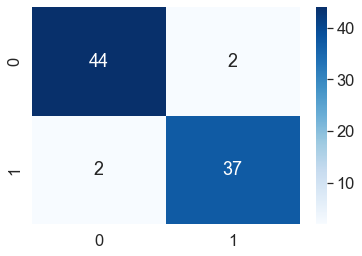

In [59]:
cm_val_xgb = confusion_matrix(y_val, y_pred)
sb.heatmap(cm_val_xgb, annot=True,  fmt="d", cmap='Blues')
sb.set(font_scale=1.5)

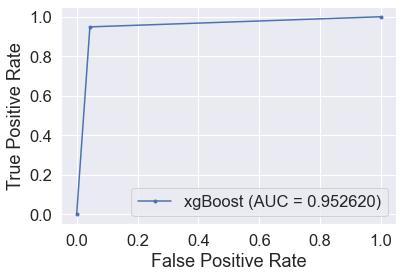

In [60]:
from sklearn.metrics import roc_curve, auc

nn_fpr_keras, nn_tpr_keras, nn_thresholds_keras = roc_curve(y_val, y_pred)
auc_keras = auc(nn_fpr_keras, nn_tpr_keras)
plt.plot(nn_fpr_keras, nn_tpr_keras, marker='.', label='xgBoost (AUC = %0.6f)' % auc_keras)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.legend(loc=4)
sb.set(font_scale=1.5)

The ideas and concepts in this xgboost kernel are taken from the following websites -

https://xgboost.readthedocs.io/en/stable/parameter.html

https://www.datacamp.com/community/tutorials/xgboost-in-python

https://blog.cambridgespark.com/getting-started-with-xgboost-3ba1488bb7d4

https://towardsdatascience.com/a-beginners-guide-to-xgboost-87f5d4c30ed7

https://heartbeat.fritz.ai/boosting-your-machine-learning-models-using-xgboost-d2cabb3e948f

https://towardsdatascience.com/https-medium-com-vishalmorde-xgboost-algorithm-long-she-may-rein-edd9f99be63d

https://medium.com/@gabrieltseng/gradient-boosting-and-xgboost-c306c1bcfaf5

https://medium.com/mlreview/gradient-boosting-from-scratch-1e317ae4587d

In [61]:
#modeling randomforestclassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
from sklearn.tree import plot_tree

In [62]:
classifier_rf = RandomForestClassifier(random_state=42, n_jobs=-1, max_depth=20, n_estimators=100, oob_score=True)

rf_class=classifier_rf.fit(x_train, y_train)

# checking the out of bag score
print('Out of bag Score is: ', classifier_rf.oob_score_)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", classifier_rf.score(x_train, y_train))
print()


# Check the Goodness of Fit (on Validation Data)
print("Goodness of Fit of Model \tValidation Dataset")
print("Classification Accuracy \t:", classifier_rf.score(x_val, y_val))
print()


Out of bag Score is:  0.9460093896713615
Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 1.0

Goodness of Fit of Model 	Validation Dataset
Classification Accuracy 	: 0.9529411764705882



In [68]:
rf_class.predict_proba(x_val) #Predictions on test set

array([[1.  , 0.  ],
       [0.93, 0.07],
       [0.  , 1.  ],
       [0.05, 0.95],
       [0.24, 0.76],
       [0.  , 1.  ],
       [0.  , 1.  ],
       [0.99, 0.01],
       [0.  , 1.  ],
       [1.  , 0.  ],
       [0.04, 0.96],
       [0.  , 1.  ],
       [0.9 , 0.1 ],
       [0.19, 0.81],
       [0.99, 0.01],
       [0.  , 1.  ],
       [1.  , 0.  ],
       [0.  , 1.  ],
       [0.89, 0.11],
       [0.84, 0.16],
       [1.  , 0.  ],
       [1.  , 0.  ],
       [0.  , 1.  ],
       [1.  , 0.  ],
       [1.  , 0.  ],
       [0.  , 1.  ],
       [1.  , 0.  ],
       [0.72, 0.28],
       [0.14, 0.86],
       [1.  , 0.  ],
       [0.29, 0.71],
       [1.  , 0.  ],
       [1.  , 0.  ],
       [0.8 , 0.2 ],
       [0.98, 0.02],
       [0.  , 1.  ],
       [0.  , 1.  ],
       [0.  , 1.  ],
       [0.96, 0.04],
       [1.  , 0.  ],
       [0.98, 0.02],
       [0.93, 0.07],
       [1.  , 0.  ],
       [0.99, 0.01],
       [0.62, 0.38],
       [0.  , 1.  ],
       [0.  , 1.  ],
       [0.  ,

In [69]:
y_pred = rf_class.predict_proba(x_val) [:,1] #Set variable of the first column 
new_y = [] 
for i in range(len(y_pred)):
    if y_pred[i] <0.50:
        new_y.append("Benign")
    else:
        new_y.append('Malignant')
        
#although the underlying table is shown to be 0 and 1, we cannot confirm that there is pressence of 0.5
#hence i set the parameter this way 

In [70]:
train_accuracy = []
validation_accuracy = []

for depth in range (1,19):
    rftree = RandomForestClassifier(max_depth = depth) #Loop from 1 to 19 depth
    rftree.fit(x_train, y_train)
    train_accuracy.append(rftree.score(x_train, y_train))
    validation_accuracy.append(rftree.score(x_val,y_val))

In [71]:
frame = pd.DataFrame({'max_depth': range(1,19), 'train_acc': train_accuracy, 'validation_acc':validation_accuracy})
frame.head(19)

,max_depth,train_acc,validation_acc
0,1,0.934272,0.905882
1,2,0.946009,0.917647
2,3,0.960094,0.941176
3,4,0.988263,0.952941
4,5,0.995305,0.941176
5,6,0.995305,0.952941
6,7,0.995305,0.952941
7,8,1.000000,0.952941
8,9,1.000000,0.952941
9,10,1.000000,0.952941


Text(0, 0.5, 'Performance')

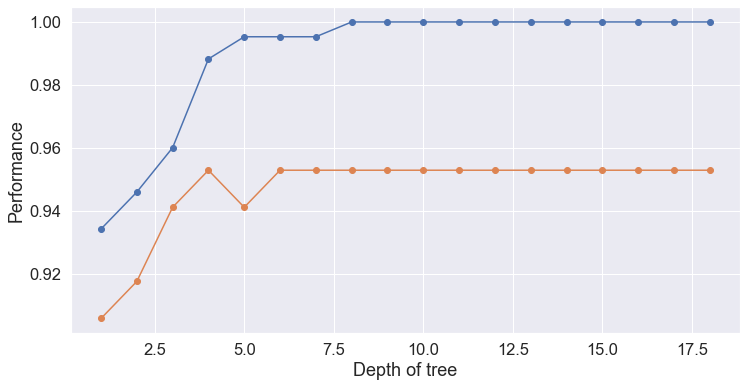

In [73]:
plt.figure(figsize = (12,6))
plt.plot(frame['max_depth'], frame['train_acc'], marker ='o')
plt.plot(frame['max_depth'], frame['validation_acc'], marker = 'o')
plt.xlabel('Depth of tree')
plt.ylabel('Performance')

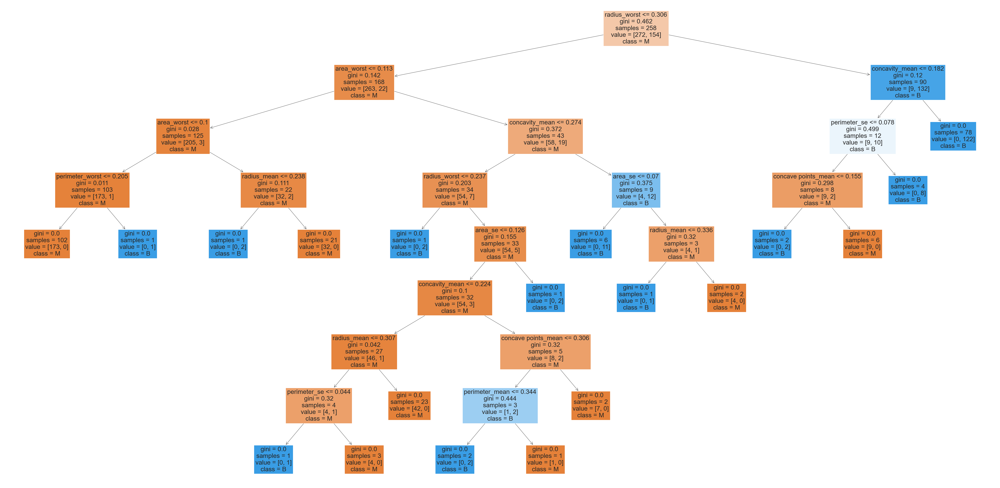

In [74]:
plt.figure(figsize=(80,40))
plot_tree(rf_class[9], feature_names = chosenV.columns,class_names=['M', "B"],filled=True); #I choose 9 as the depth


<AxesSubplot:title={'center':'RandomForest Validation Confusion Matrix'}>

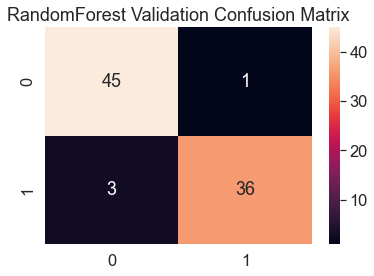

In [75]:
ax=plt.axes()
ax.set_title('RandomForest Validation Confusion Matrix')
y_val_pred = rf_class.predict(x_val)

cm_val_RF=confusion_matrix(y_val, y_val_pred)

sb.heatmap(cm_val_RF, annot = True, fmt = 'd', annot_kws = {'size': 18})
##sb.heatmap(confusion_matrix(y_val, y_val_pred), annot = True, fmt = 'd', annot_kws = {'size': 18})
#train set confusionmatrix

C:\Users\jjont\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


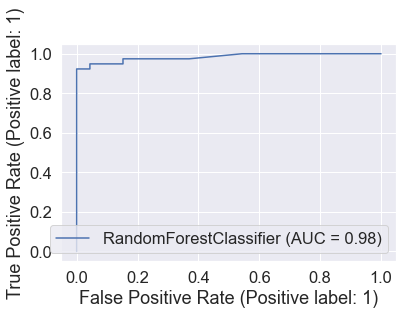

In [76]:
from sklearn.metrics import plot_roc_curve
plot_roc_curve(rf_class,x_val, y_val)

In [77]:
from sklearn.linear_model import LogisticRegression


log_reg = LogisticRegression(solver='newton-cg',multi_class='multinomial')
log_reg.fit(x_train, y_train)

LogisticRegression(multi_class='multinomial', solver='newton-cg')

In [78]:
y_pred=log_reg.predict(x_train)
y1_pred=log_reg.predict(x_val)

In [79]:
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", log_reg.score(x_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tValidation Dataset")
print("Classification Accuracy \t:", log_reg.score(x_val, y_val))
print()

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9225352112676056

Goodness of Fit of Model 	Validation Dataset
Classification Accuracy 	: 0.9176470588235294



<AxesSubplot:title={'center':'log_reg Validation Confusion Matrix'}>

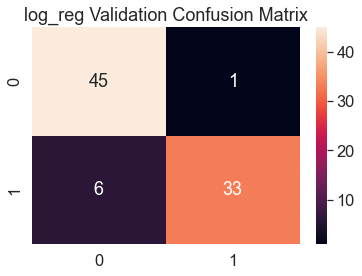

In [80]:
ax=plt.axes()
ax.set_title('log_reg Validation Confusion Matrix')

cm_val_LR=confusion_matrix(y_val, y1_pred)

sb.heatmap(cm_val_LR, annot = True, fmt = 'd', annot_kws = {'size': 18})
#validation set confusionmatrix

Support Vector Machine (Complete By Dhipan)

In [81]:
print("Training data : ",x_train.shape)
print("Training data : ",x_test.shape)

Training data :  (426, 11)
Training data :  (58, 11)


In [82]:
from sklearn.svm import SVC
classifier = SVC(kernel = 'linear', random_state = 42)
classifier.fit(x_train, y_train)

#predicting test results
Y_Pred = classifier.predict(x_test)

In [83]:
from sklearn import metrics
print('Accuracy Score: with linear kernel')
print(metrics.accuracy_score(y_test,Y_Pred))
#accuracy in linear kernel

Accuracy Score: with linear kernel
0.896551724137931


<AxesSubplot:>

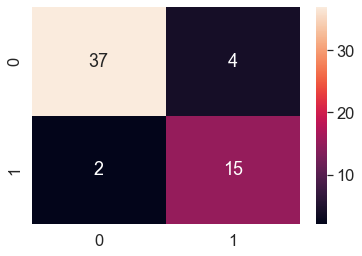

In [84]:
from sklearn.metrics import confusion_matrix
cm_val_svm = confusion_matrix(Y_Pred,y_test)
sb.heatmap(cm_val_svm,annot = True, fmt=".0f", annot_kws={"size": 18})



In [85]:
svc=SVC(kernel='poly', degree = 4)
svc.fit(x_train,y_train)
y_red=svc.predict(x_test)
print('Accuracy Score with poly kernel and degree')
print(metrics.accuracy_score(y_test,Y_Pred))

Accuracy Score with poly kernel and degree
0.896551724137931


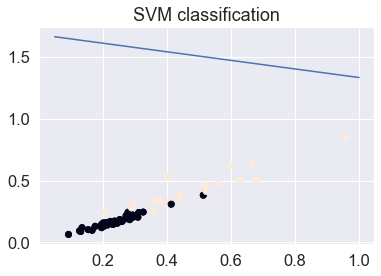

In [86]:
from sklearn.svm import SVC
import numpy as np
import matplotlib.pyplot as plt
classifier = SVC(kernel = 'linear', random_state = 42)
classifier.fit(x_train, y_train)

# predicting the test set results
Y_Pred = classifier.predict(x_test)

#plot data points
plt.scatter(x_test[:,0], x_test[:, 1],c=y_test)
ax = plt.gca()
xlim = ax.get_xlim()
ax.scatter(x_test[:,0], x_test[:, 1],c=y_test)
plt.title('SVM classification')

#creating the hyperplane
w = classifier.coef_[0]
a = -w[0] / w[1]
xx = np.linspace(xlim[0],xlim[1])
yy = a * xx - (classifier.intercept_[0] / w[1])

#plot hyperplane
plt.plot(xx, yy)
plt.axis()
plt.show()

In [87]:
from sklearn.tree import DecisionTreeClassifier

In [88]:
dt = DecisionTreeClassifier()

In [89]:
dt.fit(x_train,y_train)
#model building

DecisionTreeClassifier()

In [90]:
y_pred = dt.predict(x_test)
y_pred

array([0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0,
       1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0])

In [91]:
y_test = np.array(y_test)
y_test

array([0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0,
       1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0])

In [92]:
from sklearn.metrics import accuracy_score 

<AxesSubplot:>

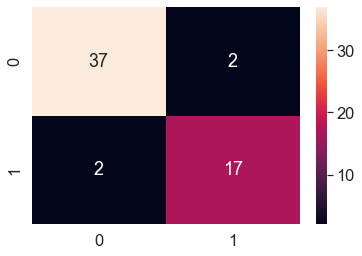

In [93]:
from sklearn.metrics import confusion_matrix
sb.heatmap(confusion_matrix(y_pred,y_test), 
           annot = True, fmt=".0f", annot_kws={"size": 18})

C:\Users\jjont\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


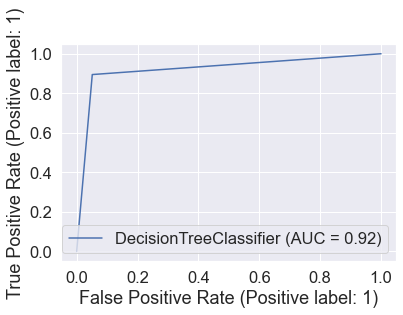

In [94]:
from sklearn.metrics import plot_roc_curve
plot_roc_curve(dt,x_test,y_test)

In [95]:
from sklearn.metrics import classification_report 

In [96]:
print(classification_report(y_pred,y_test))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95        39
           1       0.89      0.89      0.89        19

    accuracy                           0.93        58
   macro avg       0.92      0.92      0.92        58
weighted avg       0.93      0.93      0.93        58



In [97]:
from sklearn import tree

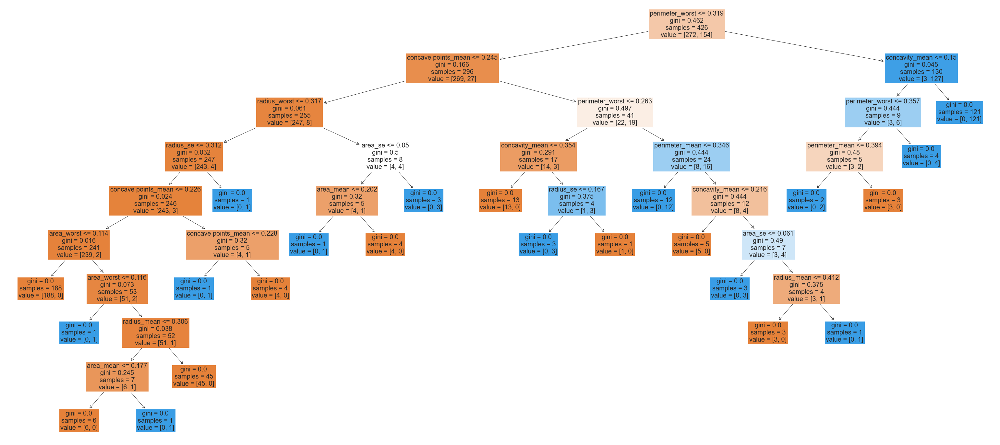

In [98]:
plt.figure(figsize=(55,25))
dtviz = tree.plot_tree(dt,feature_names=chosenV.columns,filled=True,fontsize=20,max_depth = 9)

In [99]:
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
x_train = sc_X.fit_transform(x_train)
x_test = sc_X.transform(x_test)
#scaling of data

In [100]:
from sklearn.svm import SVC
model_SVC = SVC(kernel = 'rbf', random_state = 42)
model_SVC.fit(x_train, y_train)

y_pred_svm = model_SVC.decision_function(x_test)
#svm classifier

In [101]:
from sklearn.linear_model import LogisticRegression
model_logistic = LogisticRegression()
model_logistic.fit(x_train, y_train)
#logistic classifier
y_pred_logistic = model_logistic.decision_function(x_test)

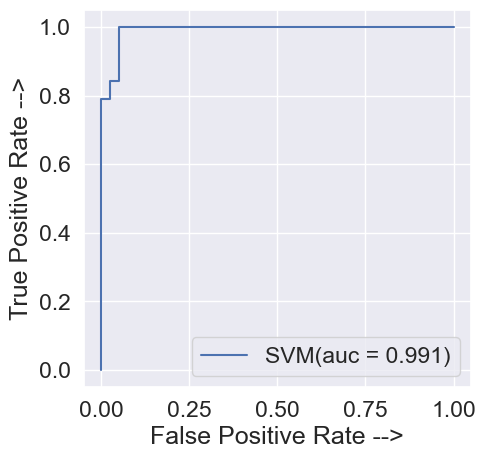

In [102]:
#plot the ROC
from sklearn.metrics import roc_curve, auc
logistic_fpr, logistic_tpr, threshold = roc_curve(y_test, y_pred_logistic)
auc_logistic = auc(logistic_fpr, logistic_tpr)

svm_fpr, svm_tpr, threshold = roc_curve(y_test, y_pred_svm)
auc_svm = auc(svm_fpr, svm_tpr)

plt.figure(figsize =(5,5), dpi=100)
plt.plot(svm_fpr, svm_tpr, linestyle ='-', label='SVM(auc = %0.3f)' % auc_svm)
plt.xlabel('False Positive Rate -->')
plt.ylabel('True Positive Rate -->')

plt.legend()
plt.show()

Plotting overall confusion matrix and ROC (Complete by Chiming)

<AxesSubplot:title={'center':'Decision Tree'}>

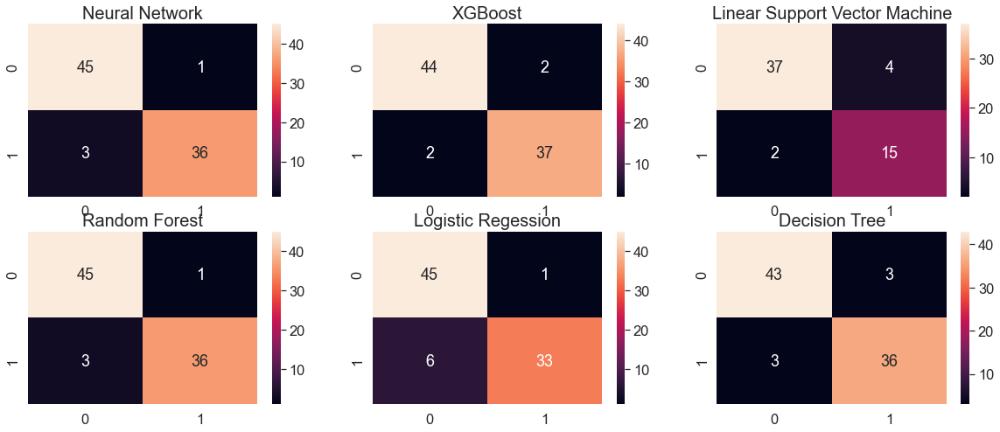

In [103]:
#plotting all heatmap tgt 
fig = plt.figure(figsize = (20,8)) # width x height
ax1 = fig.add_subplot(2, 3, 1) # row, column, position
ax2 = fig.add_subplot(2, 3, 2)
ax3 = fig.add_subplot(2, 3, 3)
ax4 = fig.add_subplot(2, 3, 4)
ax5 = fig.add_subplot(2, 3, 5)
ax6 = fig.add_subplot(2, 3, 6)


ax1.set_title('Neural Network', fontsize=20)
ax2.set_title('XGBoost', fontsize=20)
ax3.set_title('Linear Support Vector Machine', fontsize=20)
ax4.set_title('Random Forest', fontsize=20)
ax5.set_title('Logistic Regession', fontsize=20)
ax6.set_title('Decision Tree', fontsize=20)

sb.heatmap(cm_val_NN, ax=ax1, annot=True, fmt = 'd', annot_kws={'fontsize': 18},)
sb.heatmap(cm_val_xgb, ax=ax2, annot=True, fmt = 'd', annot_kws={'fontsize': 18})
sb.heatmap(cm_val_svm, ax=ax3,annot=True, fmt = 'd', annot_kws={'fontsize': 18})
sb.heatmap(cm_val_RF, ax=ax4, annot=True, fmt = 'd', annot_kws={'fontsize': 18})
sb.heatmap(cm_val_LR, ax=ax5, annot=True, fmt = 'd', annot_kws={'fontsize': 18})
sb.heatmap(cm_val_DT, ax=ax6, annot=True, fmt ='d' , annot_kws={'fontsize':18})

<Figure size 432x288 with 0 Axes>

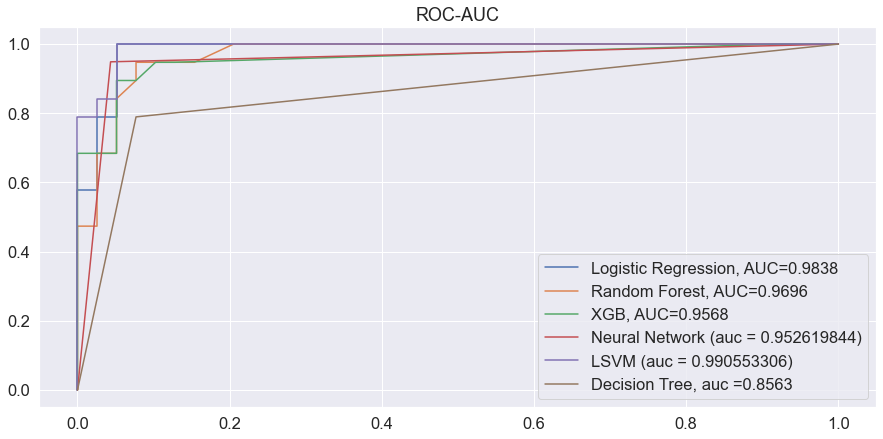

In [104]:
from sklearn import metrics

#set up plotting area
plt.figure(0).clf()

#fit logistic regression model and plot ROC curve
y_pred = log_reg.predict_proba(x_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.figure(figsize = (15,7)) # width x height
plt.plot(fpr,tpr,label="Logistic Regression, AUC="+str(auc))

#fit randomforest model and plot ROC curve
y_pred = rf_class.predict_proba(x_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="Random Forest, AUC="+str(auc))


#fit xgboost model and plot ROC curve
y_pred = xgb_clf.predict_proba(x_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="XGB, AUC="+str(auc))


#fit neural network model and plot ROC curve
plt.plot(nn_fpr_keras, nn_tpr_keras, label='Neural Network (auc = %0.9f)' % auc_keras)

#fit linear SVM and DecisionTree ROC curve
plt.plot(svm_fpr, svm_tpr, label='LSVM (auc = %0.9f)' % auc_svm)

y_pred = dt.predict_proba(x_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="Decision Tree, auc ="+str(auc))




plt.title('ROC-AUC')
plt.legend()

Conclude the best prediction model: Random Forest

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 1.0

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.9137931034482759



<AxesSubplot:title={'center':'RandomForest Test Confusion Matrix'}>

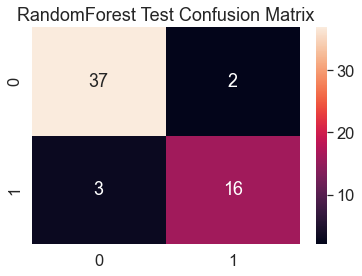

In [105]:
classifier_rf2 = RandomForestClassifier(random_state=42, n_jobs=-1, max_depth=20, n_estimators=100, oob_score=True)
rf_class2 =classifier_rf2.fit(x_train, y_train)

# checking the out of bag score

print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", classifier_rf2.score(x_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", classifier_rf2.score(x_test, y_test))
print()

y_pred = rf_class2.predict_proba(x_test) [:,1] #Set variable of the first column 
new_y = [] 
for i in range(len(y_pred)):
    if y_pred[i] <0.50:
        new_y.append("Benign")
    else:
        new_y.append('Malignant')
        
ax=plt.axes()
ax.set_title('RandomForest Test Confusion Matrix')
y_test_pred = rf_class2.predict(x_test)

cm_test_RF=confusion_matrix(y_test, y_test_pred)

sb.heatmap(cm_test_RF, annot = True, fmt = 'd', annot_kws = {'size': 18})
